## MNIST Hand Written Digit Generation using Basic GAN

In this notebook we are going to generate handwritten digits.

In [1]:
## Importing the packages ##

import torch
import torch.nn as nn
from torchvision.datasets import MNIST
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torchvision.utils import make_grid, save_image

import numpy as np
import matplotlib.pyplot as plt

Its time to import our dataset from the torchvision MNIST class, but we must converge some transforms before feeding in the values.

In [2]:
## Setting the Transformations ##

augment = transforms.Compose([
    transforms.ToTensor()
])

In [3]:
## Importing the dataset ##

mnist = MNIST(root = 'data',
              train = True,
              download = True,
              transform = augment)

Okay done! Now lets see one of the data sample.

In [4]:
## Checking one data sample ##

img , label = mnist[0]

print(img.shape)
print(label)

torch.Size([1, 28, 28])
5


In [5]:
print('Max Value:' , torch.max(mnist[0][0]))
print('Min Value:' , torch.min(mnist[0][0]))

Max Value: tensor(1.)
Min Value: tensor(0.)


Cool! The dataset is nicely downloaded.

Its always better to visualize a sample.

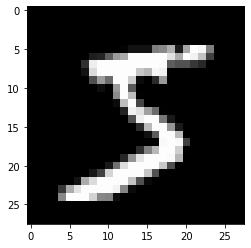

Label is : 5


In [6]:
## Plotting the image ##

plt.imshow(img.permute(1 , 2 , 0) , cmap = 'gray')
plt.show()
print('Label is :' , label)

Now, its time that we set our dataloader.

In [7]:
## Setting the Dataloader ##

mnist_dataloader = DataLoader(mnist , batch_size = 16 , shuffle = True)

To improvise on an optimized time, we utilize GPU. So, lets define some functions which would take in the data and transfer them to the GPU, when available.

Furthermore, it is also important that we generate a class for DataLoader which yields batches of data from device.

In [8]:
## Checking for GPU Availability ##

def is_gpu_available():
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    

## Transfering data ##

def transfer_data(data , device):
    if isinstance(data , (tuple , list)):
        return [transfer_data(each_data , device) for each_data in data]
    return data.to(device , non_blocking = True)

## Device DataLoader Class ##

class device_dataloader:
    def __init__(self , dl , device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        for batch in self.dl:
            yield transfer_data(batch , self.device)
    
    def __len__(self):
        return len(self.dl)

Now lets set our Dataloaders as GPU Dataloaders.

In [9]:
## Setting device ##

device = is_gpu_available()
print(device)

## Placing our Dataloaders to device ##

mnist_dl = device_dataloader(mnist_dataloader , device)

cuda


Voila! Its done!

Lets visualize a batch of images from the dataloaders by utilizing the <code>make_grid</code> method.

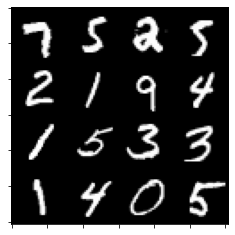

In [10]:
for img , _ in mnist_dl:
    figure , ax = plt.subplots(figsize = (4 , 4))
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    plt.imshow(make_grid(img.cpu() , 4).permute(1 , 2 , 0))
    break

Nice, it looks awesome!

Lets move on and create our Generator and Discriminator models.

In [12]:
## Generator model class ##

class Generator(nn.Module):
    def __init__(self , noise_size , hidden_size , image_size):
        super().__init__()
        self.gen_model = nn.Sequential(
        nn.Linear(noise_size , hidden_size),
        nn.BatchNorm1d(hidden_size),
        nn.ReLU(inplace = True),
        nn.Linear(hidden_size , hidden_size * 2),
        nn.BatchNorm1d(hidden_size * 2),
        nn.ReLU(inplace = True),
        nn.Linear(hidden_size * 2 , hidden_size * 4),
        nn.BatchNorm1d(hidden_size * 4),
        nn.ReLU(inplace = True),
        nn.Linear(hidden_size * 4 , hidden_size * 8),
        nn.BatchNorm1d(hidden_size * 8),
        nn.ReLU(inplace = True),
        nn.Linear(hidden_size * 8 , image_size),
        nn.Sigmoid()
        )
    
    def forward(self , xb):
        out = self.gen_model(xb)
        return out
    
## Discriminator model class ##

class Discriminator(nn.Module):
    def __init__(self , image_size , hidden_size):
        super().__init__()
        self.disc_model = nn.Sequential(
        nn.Linear(image_size , hidden_size * 4),
        nn.LeakyReLU(0.2 , inplace = True),
        nn.Linear(hidden_size * 4 , hidden_size * 2),
        nn.LeakyReLU(0.2 , inplace = True),
        nn.Linear(hidden_size * 2 , hidden_size),
        nn.LeakyReLU(0.2 , inplace = True),
        nn.Linear(hidden_size , 1)
        )
    
    def forward(self , xb):
        out = self.disc_model(xb)
        return out

Lets make our models and see their layers.

In [13]:
## Generator and Discriminator models ##

gen = Generator(64 , 128 , 784).to(device)
disc = Discriminator(784 , 128).to(device)

In [14]:
## Generator model ##
gen

Generator(
  (gen_model): Sequential(
    (0): Linear(in_features=64, out_features=128, bias=True)
    (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Linear(in_features=128, out_features=256, bias=True)
    (4): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): Linear(in_features=256, out_features=512, bias=True)
    (7): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): Linear(in_features=512, out_features=1024, bias=True)
    (10): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): Linear(in_features=1024, out_features=784, bias=True)
    (13): Sigmoid()
  )
)

In [15]:
## Discriminator model ##

disc

Discriminator(
  (disc_model): Sequential(
    (0): Linear(in_features=784, out_features=512, bias=True)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Linear(in_features=512, out_features=256, bias=True)
    (3): LeakyReLU(negative_slope=0.2, inplace=True)
    (4): Linear(in_features=256, out_features=128, bias=True)
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): Linear(in_features=128, out_features=1, bias=True)
  )
)

Lets set our loss function.

In [16]:
## Set loss function ##

criterion = nn.BCEWithLogitsLoss()

Lets set our generator and discriminator training.

In [17]:
## Discriminator Training ##

def disc_training(disc , gen , criterion , img , device , batch_size):
    noise = torch.randn(batch_size , 64).to(device)
    fake_img = gen(noise).detach()
    fake_pred = disc(fake_img)
    fake_target = torch.zeros(batch_size , 1).to(device)
    fake_loss = criterion(fake_pred , fake_target)
    
    real_pred = disc(img).to(device)
    real_target = torch.ones(batch_size , 1).to(device)
    real_loss = criterion(real_pred , real_target)
    
    disc_loss = (real_loss + fake_loss) / 2
    
    return disc_loss

In [18]:
## Generator Training ##

def gen_training(disc , gen , criterion , device , batch_size):
    noise = torch.randn(batch_size , 64).to(device)
    fake_img = gen(noise)
    fake_pred = disc(fake_img).to(device)
    fake_target = torch.ones(batch_size , 1).to(device)
    gen_loss = criterion(fake_pred , fake_target)
    return gen_loss

In [19]:
gen_optim = torch.optim.Adam(gen.parameters() , lr = 1e-5)
disc_optim = torch.optim.Adam(disc.parameters() , lr = 1e-5)

In [20]:
def show_img(gen_img , batch_size):
    gen_img = gen_img.reshape(batch_size , 1 , 28 , 28)
    figure , ax = plt.subplots(figsize = (4 , 4))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.imshow(make_grid(gen_img.cpu() , 4).permute(1 , 2 , 0))
    plt.show()

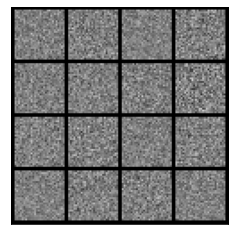

In [21]:
gen_img = gen(torch.randn(16 , 64).to(device)).detach()
show_img(gen_img , 16)

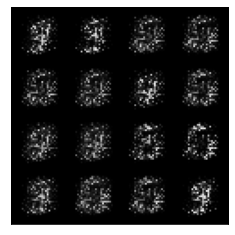

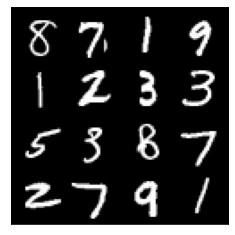

Epoch : [1 / 200] --> Discriminator Loss : 0.0891 , Generator Loss : 2.9400


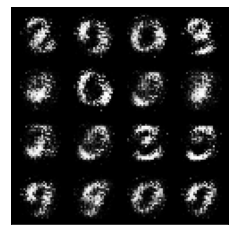

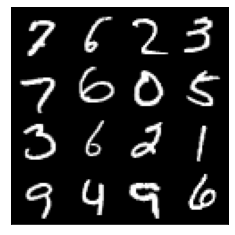

Epoch : [2 / 200] --> Discriminator Loss : 0.2312 , Generator Loss : 3.0623


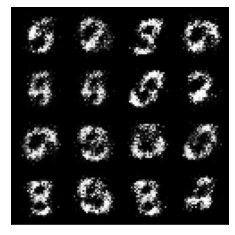

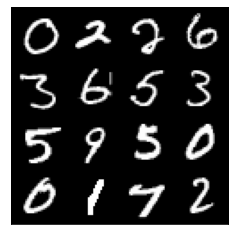

Epoch : [3 / 200] --> Discriminator Loss : 0.0360 , Generator Loss : 3.5941


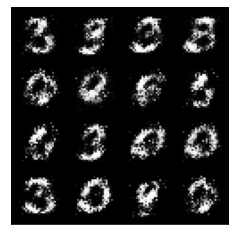

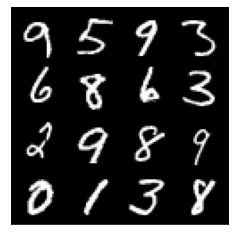

Epoch : [4 / 200] --> Discriminator Loss : 0.0515 , Generator Loss : 4.0607


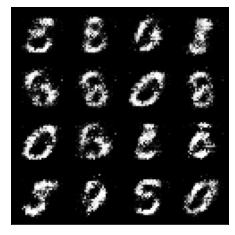

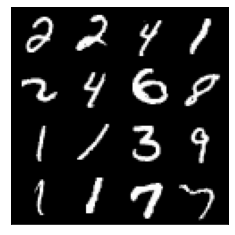

Epoch : [5 / 200] --> Discriminator Loss : 0.0852 , Generator Loss : 3.0401


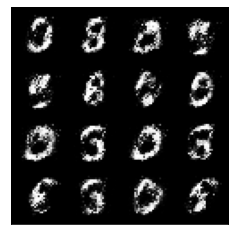

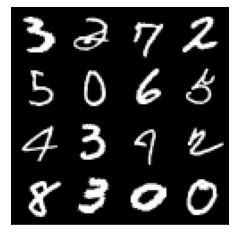

Epoch : [6 / 200] --> Discriminator Loss : 0.1550 , Generator Loss : 3.1476


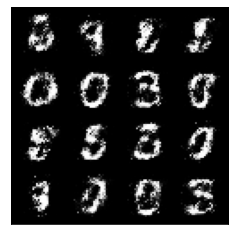

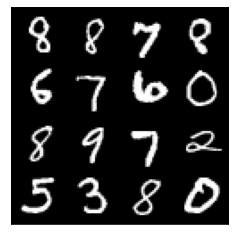

Epoch : [7 / 200] --> Discriminator Loss : 0.2347 , Generator Loss : 2.1662


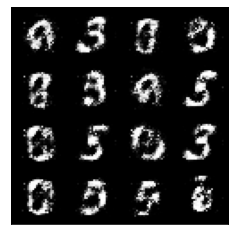

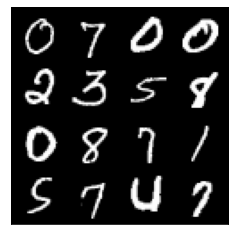

Epoch : [8 / 200] --> Discriminator Loss : 0.2722 , Generator Loss : 2.7433


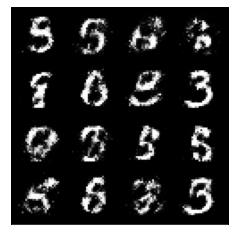

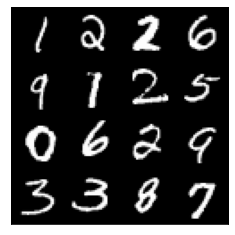

Epoch : [9 / 200] --> Discriminator Loss : 0.0889 , Generator Loss : 2.7942


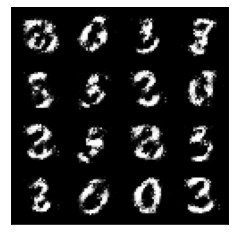

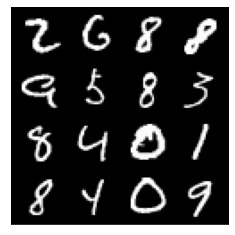

Epoch : [10 / 200] --> Discriminator Loss : 0.5005 , Generator Loss : 1.7612


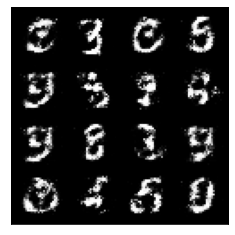

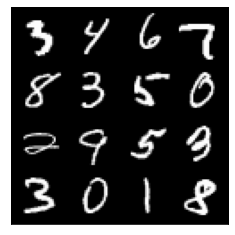

Epoch : [11 / 200] --> Discriminator Loss : 0.2646 , Generator Loss : 2.8297


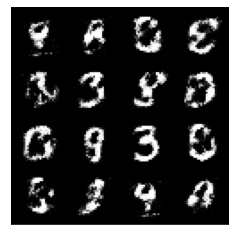

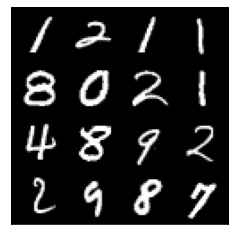

Epoch : [12 / 200] --> Discriminator Loss : 0.3449 , Generator Loss : 1.7743


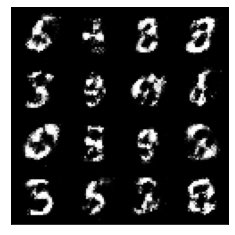

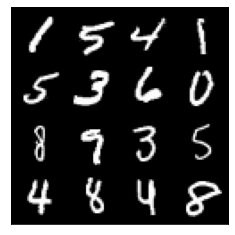

Epoch : [13 / 200] --> Discriminator Loss : 0.3732 , Generator Loss : 2.1926


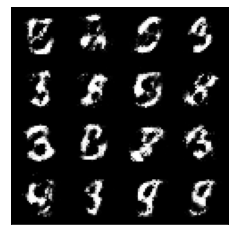

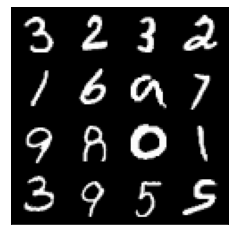

Epoch : [14 / 200] --> Discriminator Loss : 0.4084 , Generator Loss : 2.6525


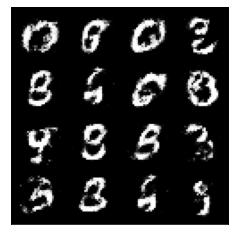

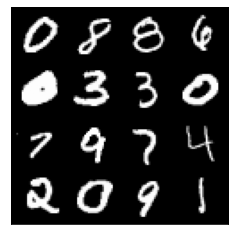

Epoch : [15 / 200] --> Discriminator Loss : 0.7612 , Generator Loss : 1.4736


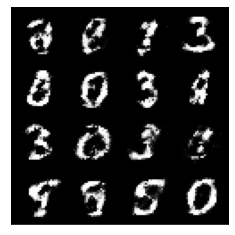

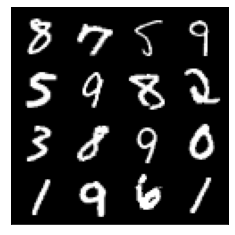

Epoch : [16 / 200] --> Discriminator Loss : 0.4997 , Generator Loss : 2.4542


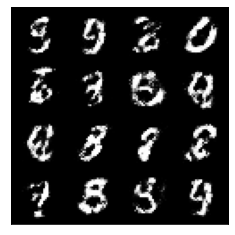

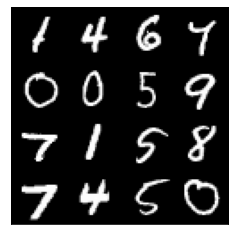

Epoch : [17 / 200] --> Discriminator Loss : 0.4685 , Generator Loss : 1.5629


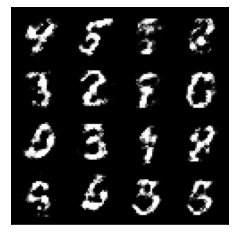

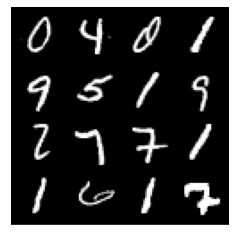

Epoch : [18 / 200] --> Discriminator Loss : 0.2453 , Generator Loss : 2.2277


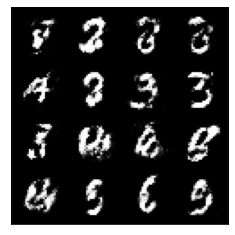

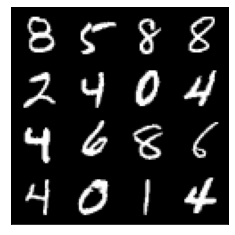

Epoch : [19 / 200] --> Discriminator Loss : 0.4704 , Generator Loss : 1.3086


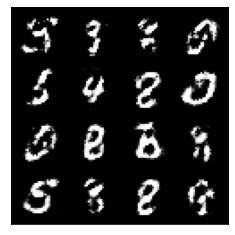

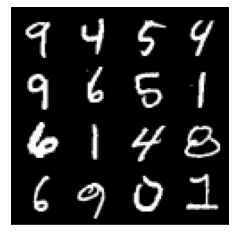

Epoch : [20 / 200] --> Discriminator Loss : 0.3402 , Generator Loss : 1.4920


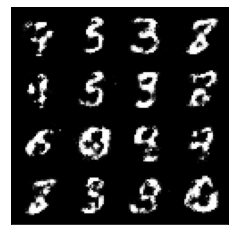

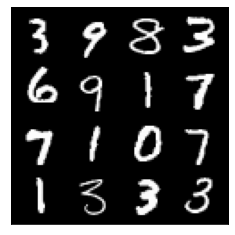

Epoch : [21 / 200] --> Discriminator Loss : 0.4494 , Generator Loss : 1.5919


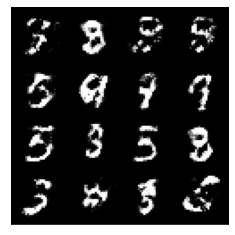

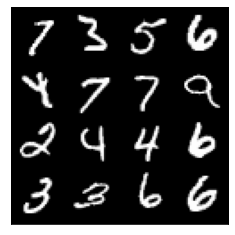

Epoch : [22 / 200] --> Discriminator Loss : 0.3290 , Generator Loss : 1.9829


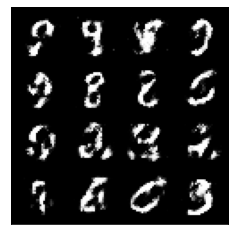

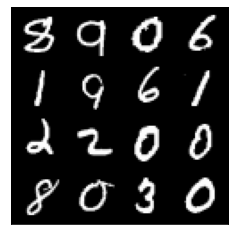

Epoch : [23 / 200] --> Discriminator Loss : 0.4478 , Generator Loss : 1.6526


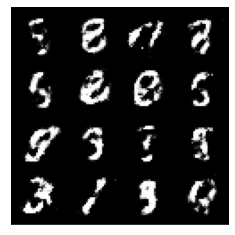

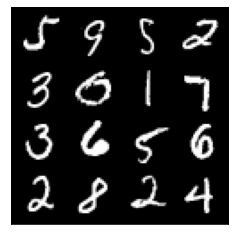

Epoch : [24 / 200] --> Discriminator Loss : 0.5235 , Generator Loss : 1.3128


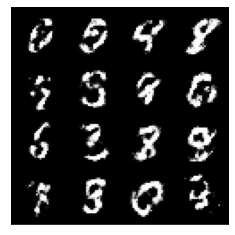

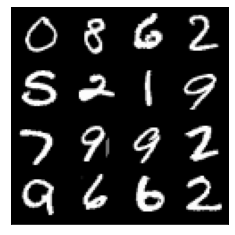

Epoch : [25 / 200] --> Discriminator Loss : 0.3477 , Generator Loss : 1.3469


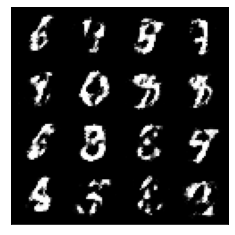

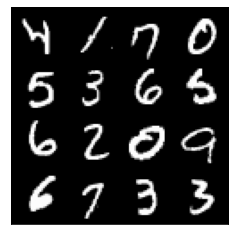

Epoch : [26 / 200] --> Discriminator Loss : 0.4261 , Generator Loss : 1.0623


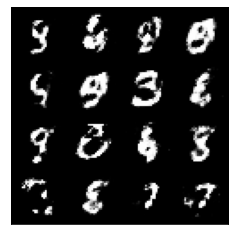

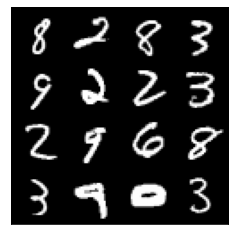

Epoch : [27 / 200] --> Discriminator Loss : 0.3255 , Generator Loss : 1.3325


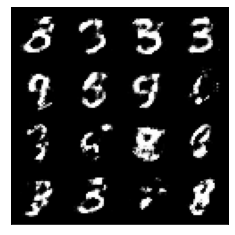

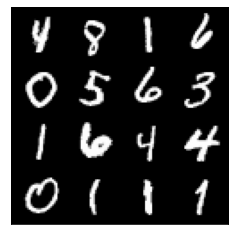

Epoch : [28 / 200] --> Discriminator Loss : 0.4686 , Generator Loss : 1.6145


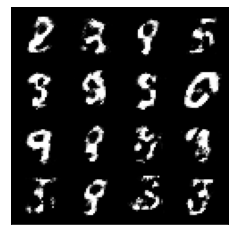

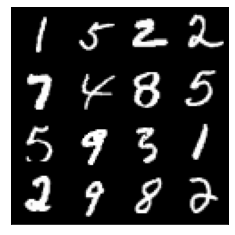

Epoch : [29 / 200] --> Discriminator Loss : 0.4696 , Generator Loss : 1.6680


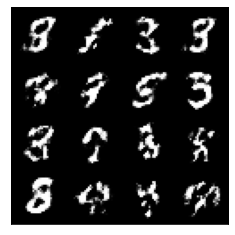

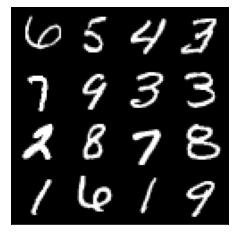

Epoch : [30 / 200] --> Discriminator Loss : 0.2960 , Generator Loss : 1.4573


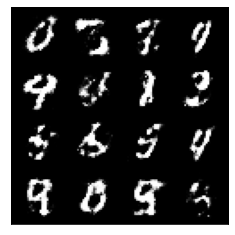

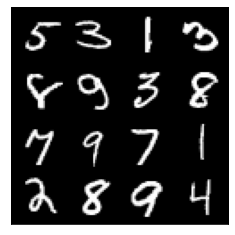

Epoch : [31 / 200] --> Discriminator Loss : 0.3995 , Generator Loss : 1.7879


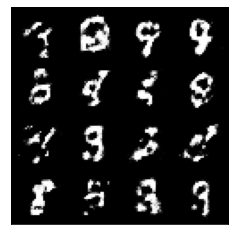

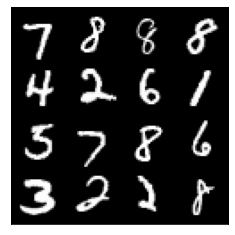

Epoch : [32 / 200] --> Discriminator Loss : 0.5405 , Generator Loss : 1.3593


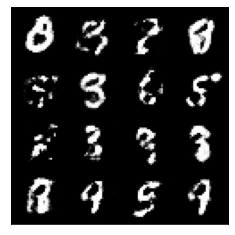

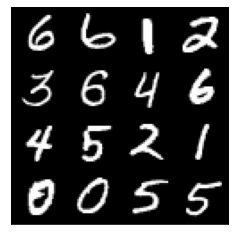

Epoch : [33 / 200] --> Discriminator Loss : 0.4424 , Generator Loss : 1.1370


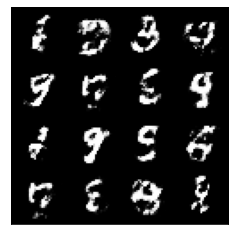

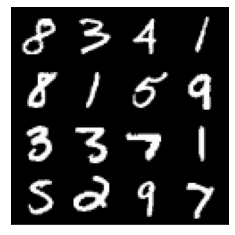

Epoch : [34 / 200] --> Discriminator Loss : 0.3551 , Generator Loss : 1.5955


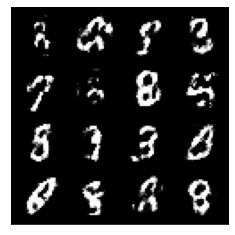

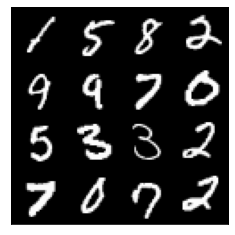

Epoch : [35 / 200] --> Discriminator Loss : 0.3572 , Generator Loss : 1.4526


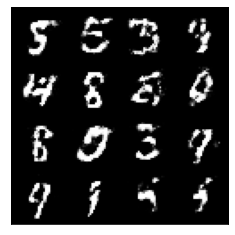

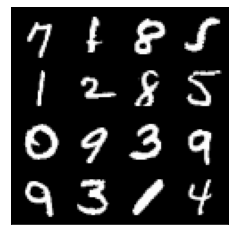

Epoch : [36 / 200] --> Discriminator Loss : 0.4701 , Generator Loss : 1.3003


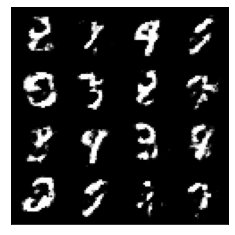

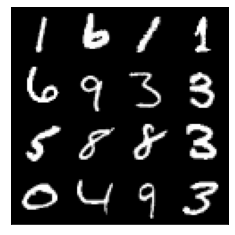

Epoch : [37 / 200] --> Discriminator Loss : 0.4070 , Generator Loss : 1.4768


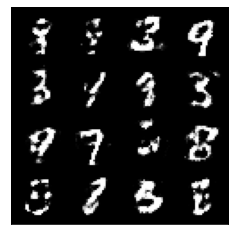

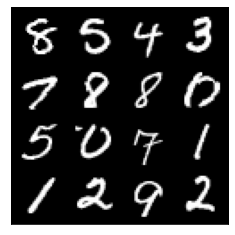

Epoch : [38 / 200] --> Discriminator Loss : 0.4701 , Generator Loss : 1.3704


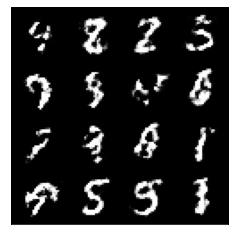

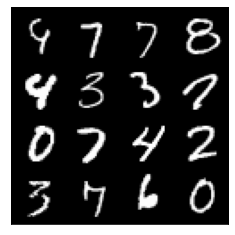

Epoch : [39 / 200] --> Discriminator Loss : 0.7023 , Generator Loss : 1.4077


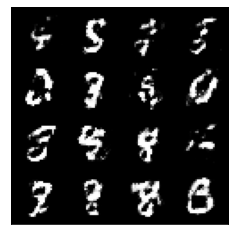

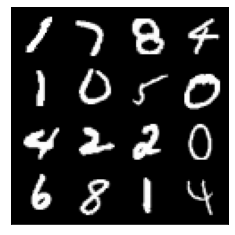

Epoch : [40 / 200] --> Discriminator Loss : 0.3778 , Generator Loss : 1.4128


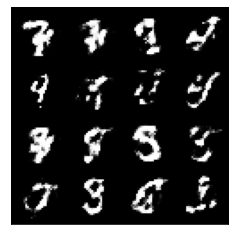

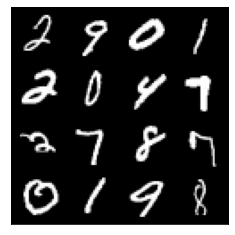

Epoch : [41 / 200] --> Discriminator Loss : 0.6286 , Generator Loss : 1.4694


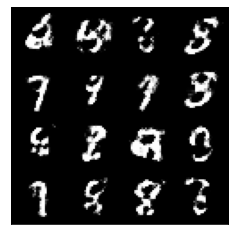

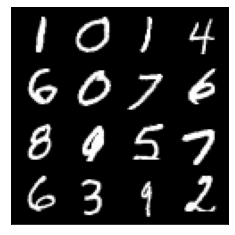

Epoch : [42 / 200] --> Discriminator Loss : 0.3831 , Generator Loss : 1.3515


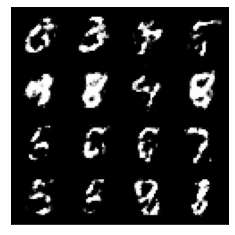

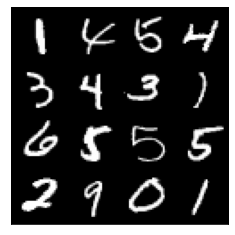

Epoch : [43 / 200] --> Discriminator Loss : 0.3072 , Generator Loss : 1.5081


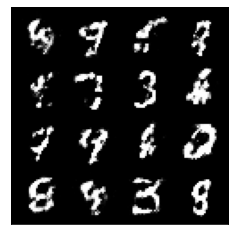

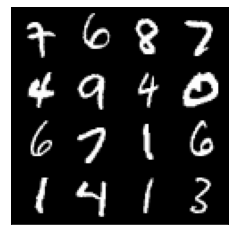

Epoch : [44 / 200] --> Discriminator Loss : 0.3728 , Generator Loss : 1.2639


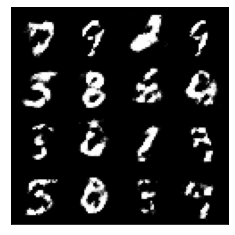

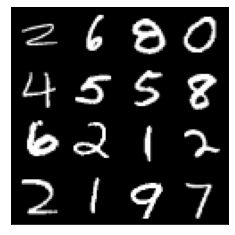

Epoch : [45 / 200] --> Discriminator Loss : 0.4295 , Generator Loss : 1.3916


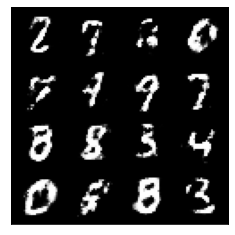

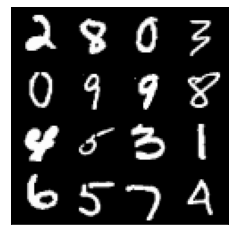

Epoch : [46 / 200] --> Discriminator Loss : 0.4990 , Generator Loss : 1.1754


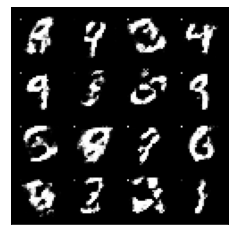

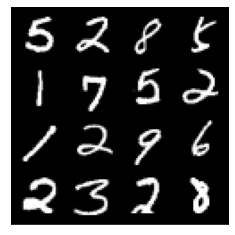

Epoch : [47 / 200] --> Discriminator Loss : 0.3899 , Generator Loss : 1.3126


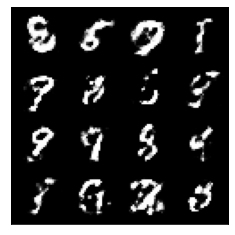

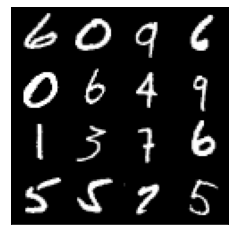

Epoch : [48 / 200] --> Discriminator Loss : 0.4137 , Generator Loss : 1.1819


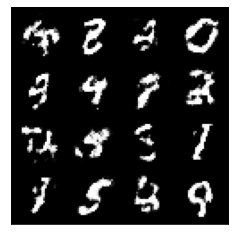

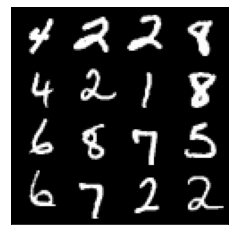

Epoch : [49 / 200] --> Discriminator Loss : 0.4554 , Generator Loss : 1.2494


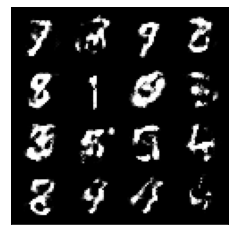

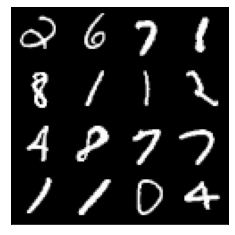

Epoch : [50 / 200] --> Discriminator Loss : 0.5042 , Generator Loss : 1.2224


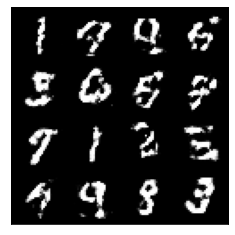

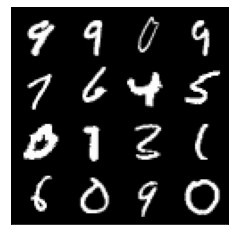

Epoch : [51 / 200] --> Discriminator Loss : 0.6314 , Generator Loss : 1.6520


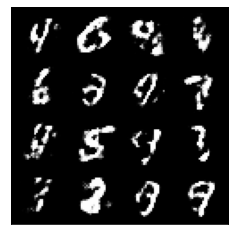

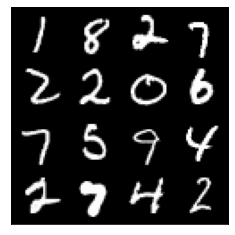

Epoch : [52 / 200] --> Discriminator Loss : 0.3973 , Generator Loss : 1.0344


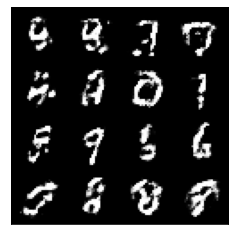

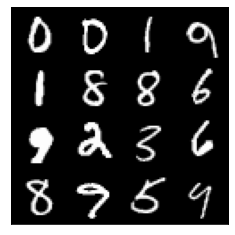

Epoch : [53 / 200] --> Discriminator Loss : 0.5342 , Generator Loss : 1.0594


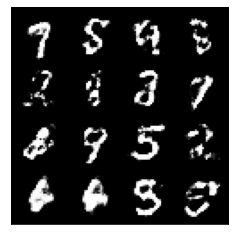

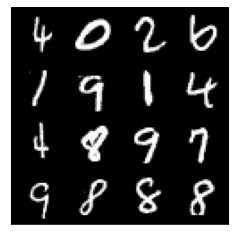

Epoch : [54 / 200] --> Discriminator Loss : 0.4563 , Generator Loss : 1.2753


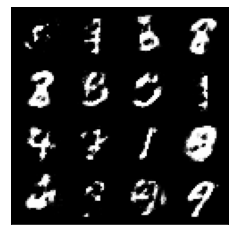

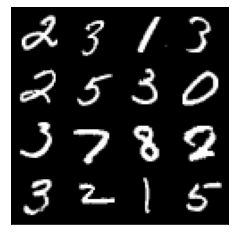

Epoch : [55 / 200] --> Discriminator Loss : 0.5356 , Generator Loss : 1.0347


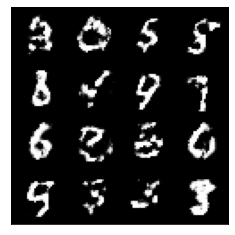

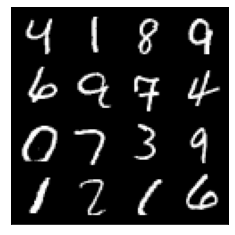

Epoch : [56 / 200] --> Discriminator Loss : 0.4354 , Generator Loss : 1.3916


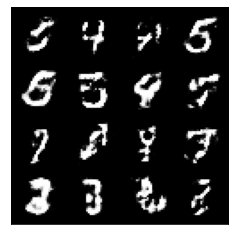

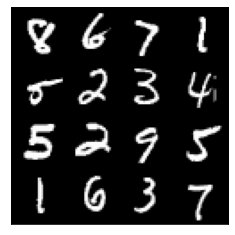

Epoch : [57 / 200] --> Discriminator Loss : 0.5085 , Generator Loss : 0.9495


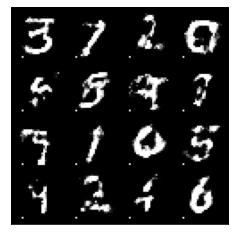

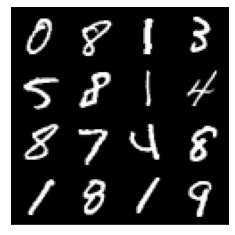

Epoch : [58 / 200] --> Discriminator Loss : 0.6556 , Generator Loss : 0.7896


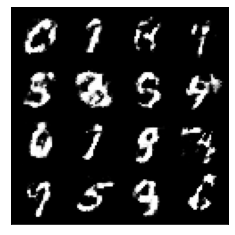

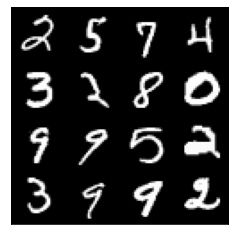

Epoch : [59 / 200] --> Discriminator Loss : 0.5551 , Generator Loss : 1.3052


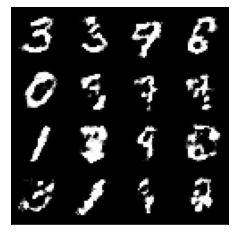

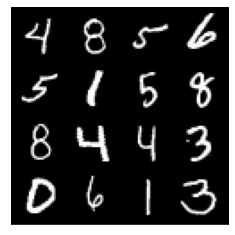

Epoch : [60 / 200] --> Discriminator Loss : 0.5238 , Generator Loss : 1.3263


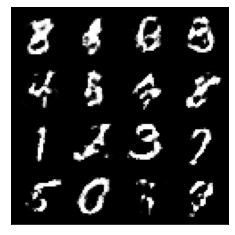

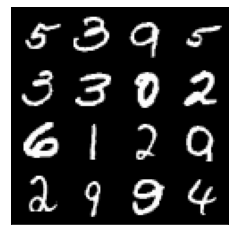

Epoch : [61 / 200] --> Discriminator Loss : 0.5822 , Generator Loss : 1.2553


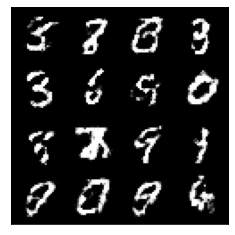

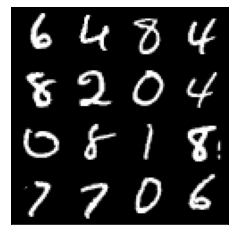

Epoch : [62 / 200] --> Discriminator Loss : 0.4919 , Generator Loss : 0.8037


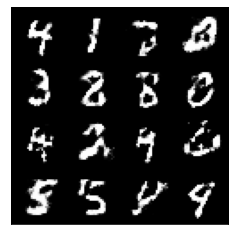

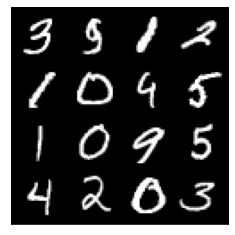

Epoch : [63 / 200] --> Discriminator Loss : 0.4904 , Generator Loss : 0.9735


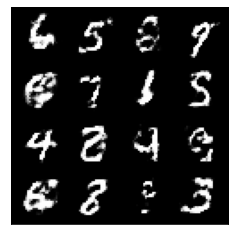

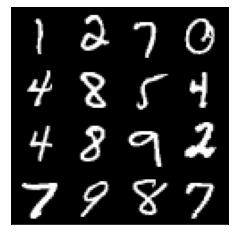

Epoch : [64 / 200] --> Discriminator Loss : 0.5577 , Generator Loss : 1.1252


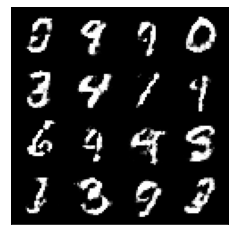

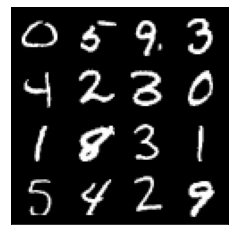

Epoch : [65 / 200] --> Discriminator Loss : 0.5404 , Generator Loss : 1.2279


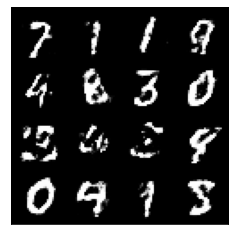

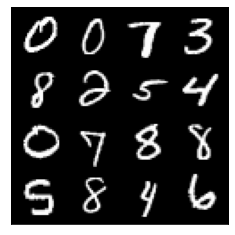

Epoch : [66 / 200] --> Discriminator Loss : 0.4439 , Generator Loss : 1.2654


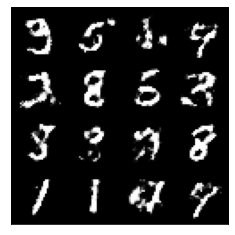

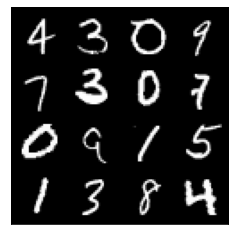

Epoch : [67 / 200] --> Discriminator Loss : 0.6934 , Generator Loss : 1.2410


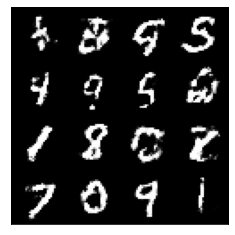

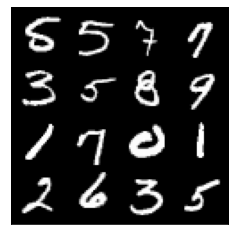

Epoch : [68 / 200] --> Discriminator Loss : 0.4707 , Generator Loss : 1.2983


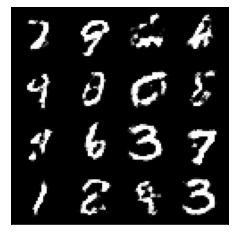

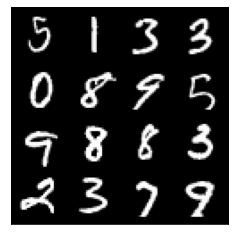

Epoch : [69 / 200] --> Discriminator Loss : 0.6121 , Generator Loss : 0.9127


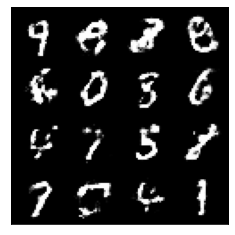

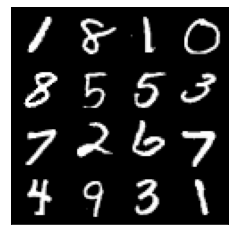

Epoch : [70 / 200] --> Discriminator Loss : 0.4342 , Generator Loss : 1.0511


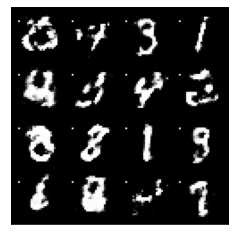

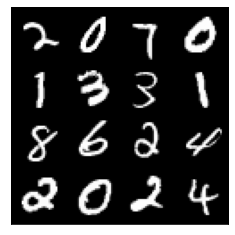

Epoch : [71 / 200] --> Discriminator Loss : 0.5486 , Generator Loss : 0.9989


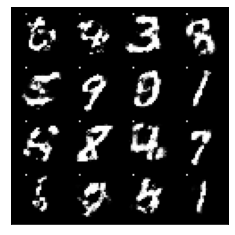

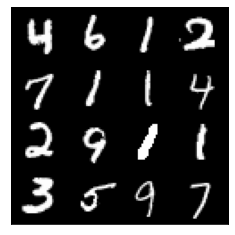

Epoch : [72 / 200] --> Discriminator Loss : 0.6547 , Generator Loss : 0.7814


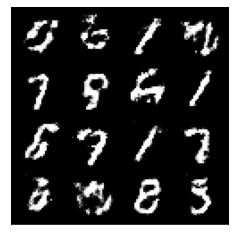

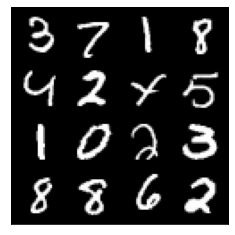

Epoch : [73 / 200] --> Discriminator Loss : 0.5834 , Generator Loss : 0.7992


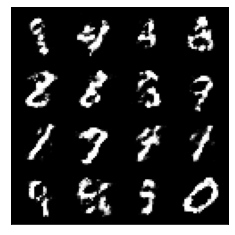

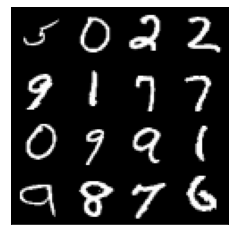

Epoch : [74 / 200] --> Discriminator Loss : 0.5744 , Generator Loss : 1.1742


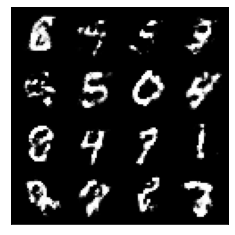

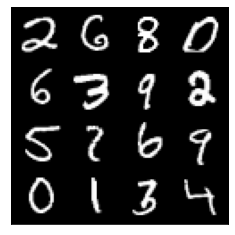

Epoch : [75 / 200] --> Discriminator Loss : 0.6076 , Generator Loss : 0.8295


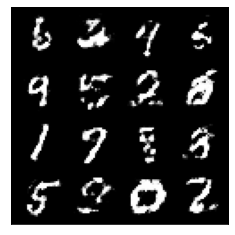

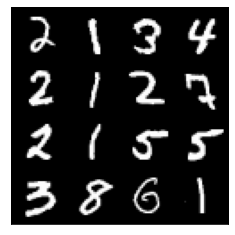

Epoch : [76 / 200] --> Discriminator Loss : 0.6370 , Generator Loss : 0.8359


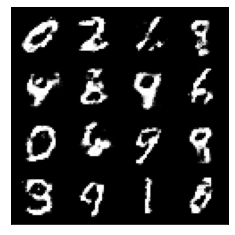

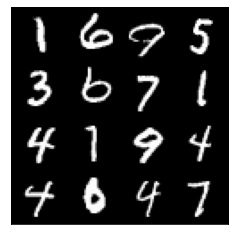

Epoch : [77 / 200] --> Discriminator Loss : 0.6996 , Generator Loss : 1.1566


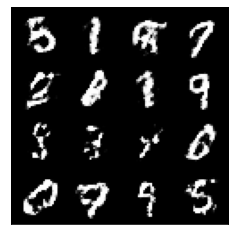

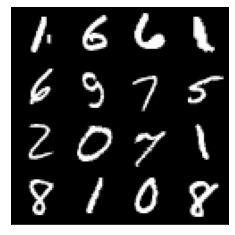

Epoch : [78 / 200] --> Discriminator Loss : 0.5720 , Generator Loss : 0.9787


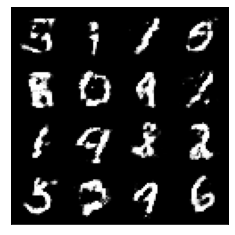

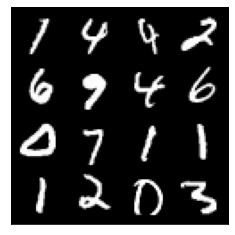

Epoch : [79 / 200] --> Discriminator Loss : 0.6301 , Generator Loss : 1.0896


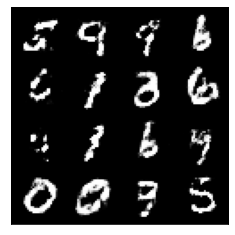

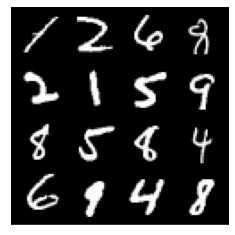

Epoch : [80 / 200] --> Discriminator Loss : 0.7376 , Generator Loss : 1.0056


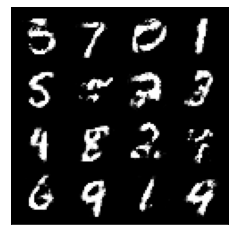

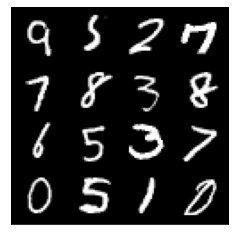

Epoch : [81 / 200] --> Discriminator Loss : 0.5864 , Generator Loss : 0.9966


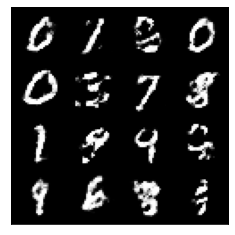

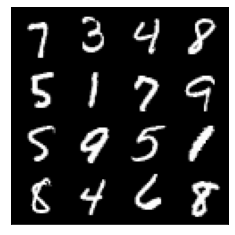

Epoch : [82 / 200] --> Discriminator Loss : 0.5800 , Generator Loss : 0.9449


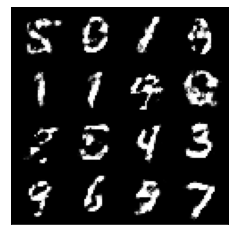

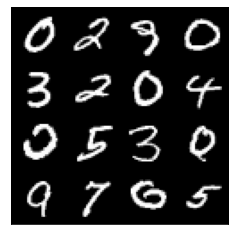

Epoch : [83 / 200] --> Discriminator Loss : 0.5787 , Generator Loss : 0.9488


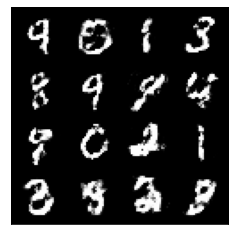

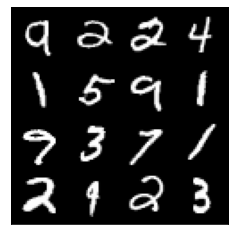

Epoch : [84 / 200] --> Discriminator Loss : 0.5552 , Generator Loss : 0.9549


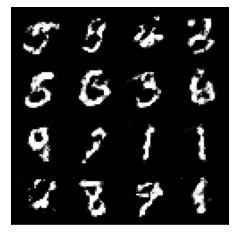

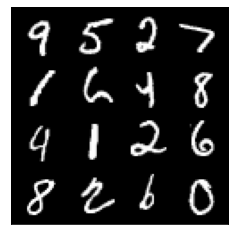

Epoch : [85 / 200] --> Discriminator Loss : 0.6159 , Generator Loss : 0.7785


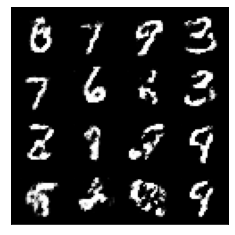

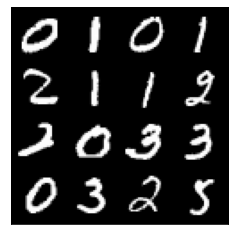

Epoch : [86 / 200] --> Discriminator Loss : 0.5815 , Generator Loss : 0.9739


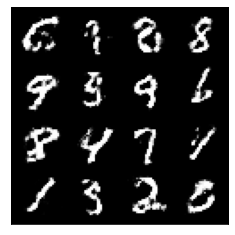

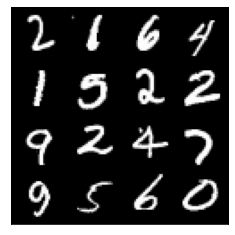

Epoch : [87 / 200] --> Discriminator Loss : 0.5451 , Generator Loss : 0.8002


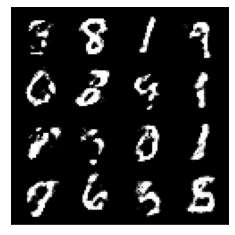

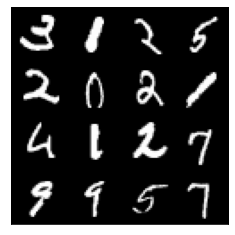

Epoch : [88 / 200] --> Discriminator Loss : 0.5697 , Generator Loss : 1.0692


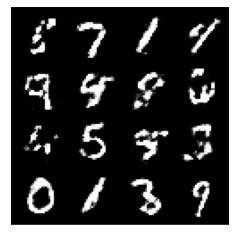

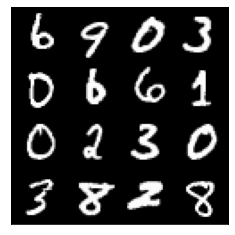

Epoch : [89 / 200] --> Discriminator Loss : 0.5412 , Generator Loss : 0.9607


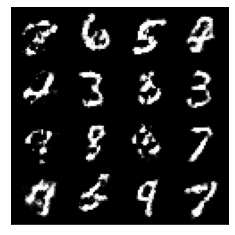

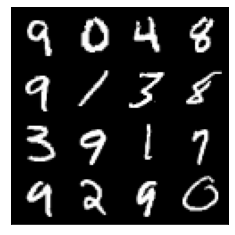

Epoch : [90 / 200] --> Discriminator Loss : 0.5679 , Generator Loss : 0.9302


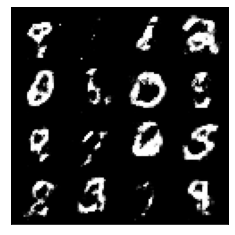

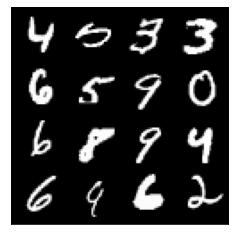

Epoch : [91 / 200] --> Discriminator Loss : 0.6131 , Generator Loss : 0.7701


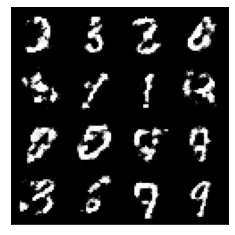

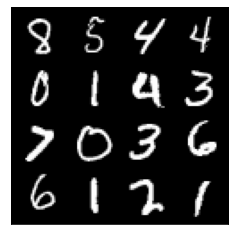

Epoch : [92 / 200] --> Discriminator Loss : 0.6059 , Generator Loss : 0.9407


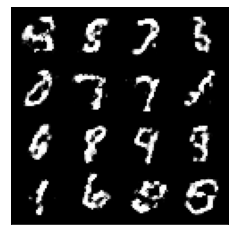

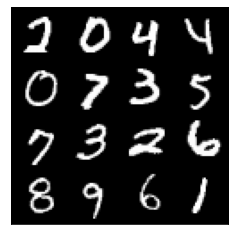

Epoch : [93 / 200] --> Discriminator Loss : 0.5134 , Generator Loss : 1.0433


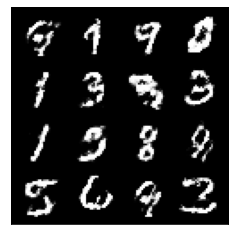

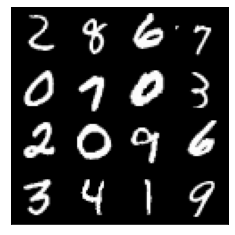

Epoch : [94 / 200] --> Discriminator Loss : 0.5187 , Generator Loss : 0.9739


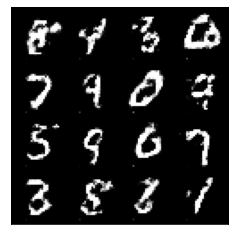

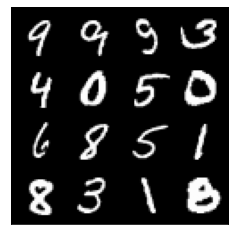

Epoch : [95 / 200] --> Discriminator Loss : 0.6134 , Generator Loss : 0.9102


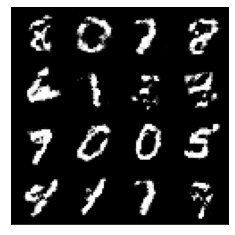

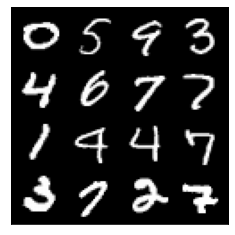

Epoch : [96 / 200] --> Discriminator Loss : 0.4597 , Generator Loss : 1.1202


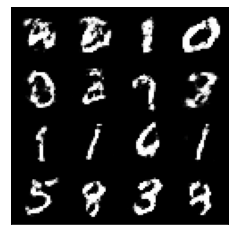

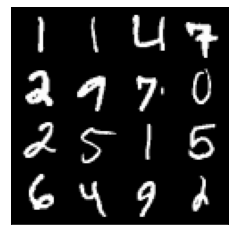

Epoch : [97 / 200] --> Discriminator Loss : 0.5916 , Generator Loss : 0.9145


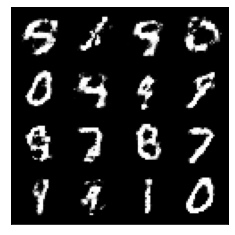

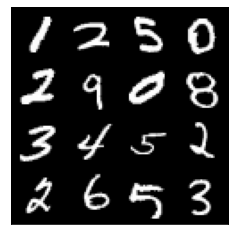

Epoch : [98 / 200] --> Discriminator Loss : 0.4849 , Generator Loss : 1.1430


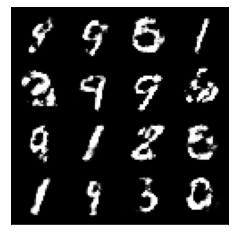

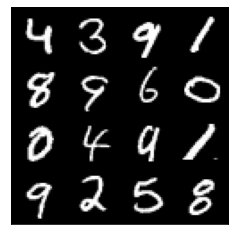

Epoch : [99 / 200] --> Discriminator Loss : 0.5875 , Generator Loss : 1.0363


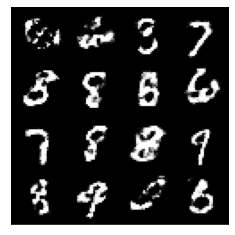

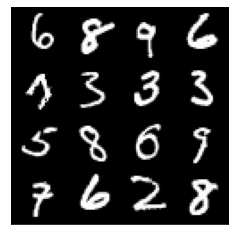

Epoch : [100 / 200] --> Discriminator Loss : 0.5328 , Generator Loss : 1.1311


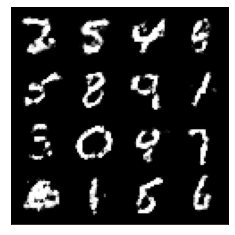

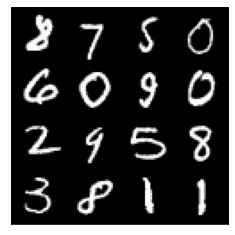

Epoch : [101 / 200] --> Discriminator Loss : 0.5970 , Generator Loss : 0.8978


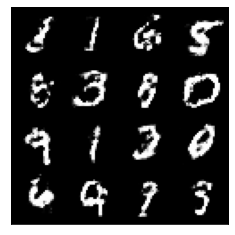

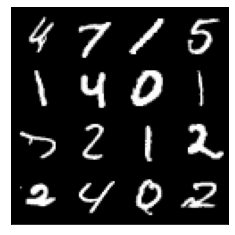

Epoch : [102 / 200] --> Discriminator Loss : 0.4829 , Generator Loss : 0.9277


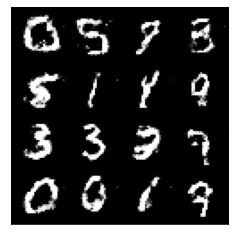

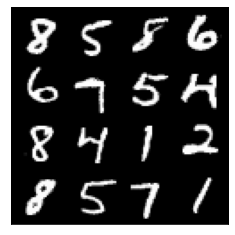

Epoch : [103 / 200] --> Discriminator Loss : 0.6254 , Generator Loss : 0.7592


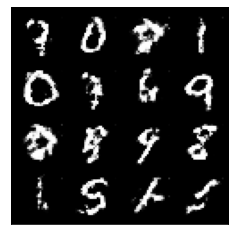

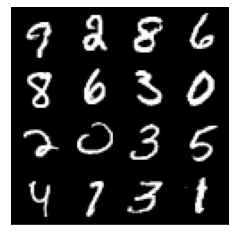

Epoch : [104 / 200] --> Discriminator Loss : 0.6345 , Generator Loss : 0.8252


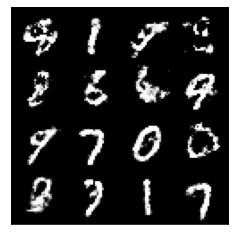

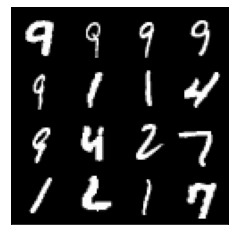

Epoch : [105 / 200] --> Discriminator Loss : 0.6820 , Generator Loss : 0.8186


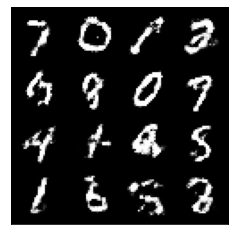

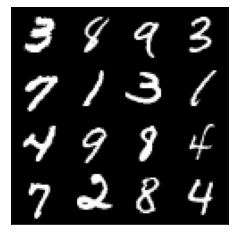

Epoch : [106 / 200] --> Discriminator Loss : 0.6937 , Generator Loss : 1.0230


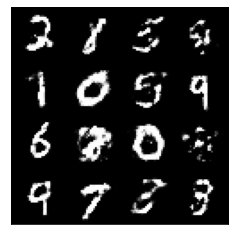

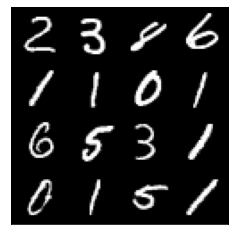

Epoch : [107 / 200] --> Discriminator Loss : 0.5191 , Generator Loss : 0.9437


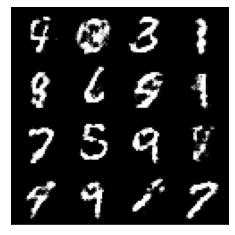

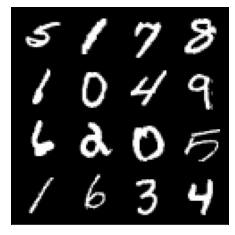

Epoch : [108 / 200] --> Discriminator Loss : 0.7236 , Generator Loss : 0.9657


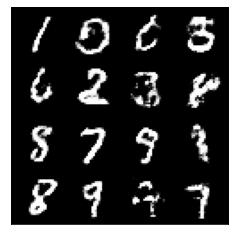

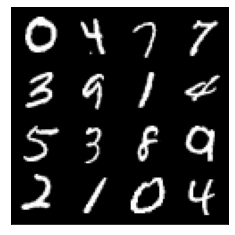

Epoch : [109 / 200] --> Discriminator Loss : 0.5665 , Generator Loss : 0.7562


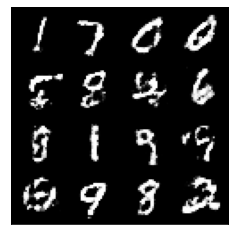

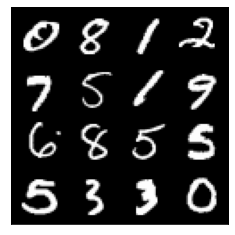

Epoch : [110 / 200] --> Discriminator Loss : 0.6218 , Generator Loss : 0.9552


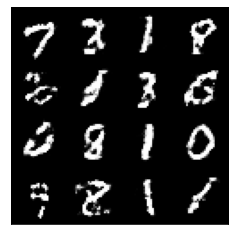

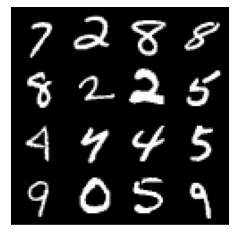

Epoch : [111 / 200] --> Discriminator Loss : 0.6095 , Generator Loss : 0.9139


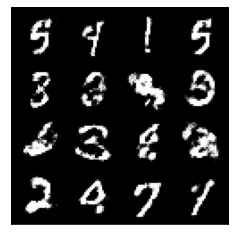

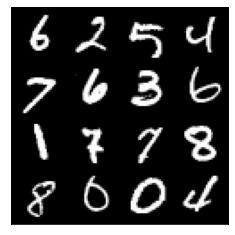

Epoch : [112 / 200] --> Discriminator Loss : 0.5415 , Generator Loss : 1.1892


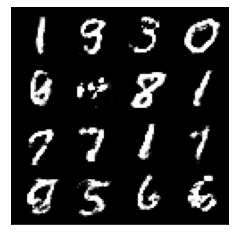

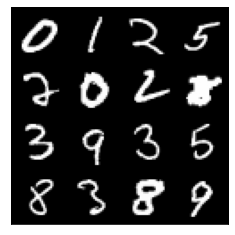

Epoch : [113 / 200] --> Discriminator Loss : 0.6044 , Generator Loss : 1.0725


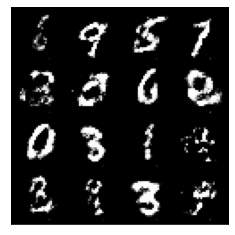

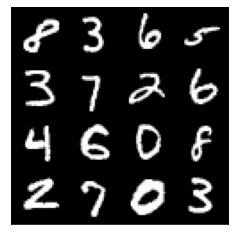

Epoch : [114 / 200] --> Discriminator Loss : 0.6213 , Generator Loss : 0.7014


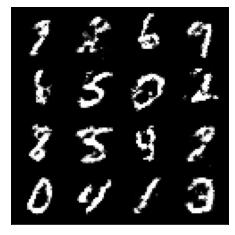

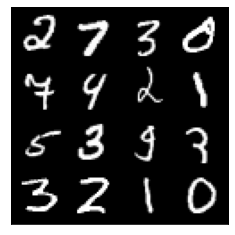

Epoch : [115 / 200] --> Discriminator Loss : 0.5299 , Generator Loss : 1.1937


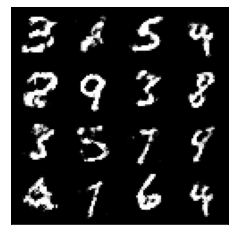

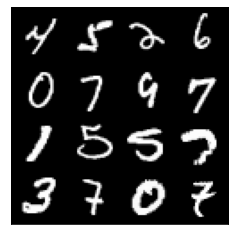

Epoch : [116 / 200] --> Discriminator Loss : 0.5075 , Generator Loss : 1.0905


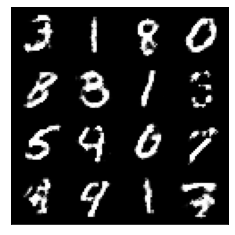

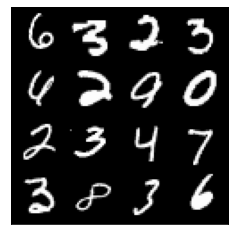

Epoch : [117 / 200] --> Discriminator Loss : 0.5675 , Generator Loss : 1.1741


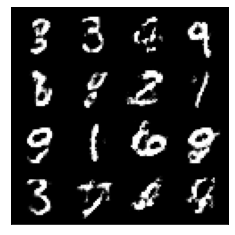

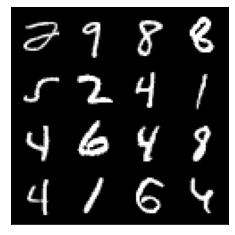

Epoch : [118 / 200] --> Discriminator Loss : 0.5261 , Generator Loss : 0.9513


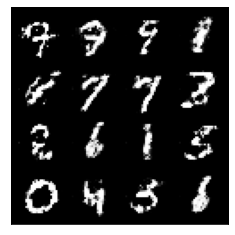

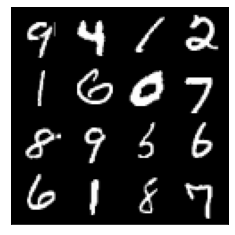

Epoch : [119 / 200] --> Discriminator Loss : 0.6475 , Generator Loss : 0.9764


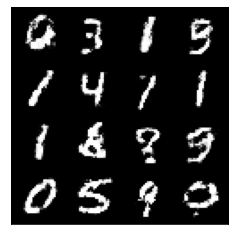

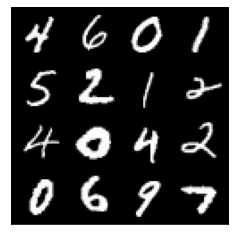

Epoch : [120 / 200] --> Discriminator Loss : 0.5596 , Generator Loss : 1.1345


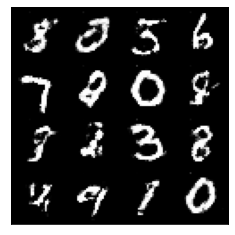

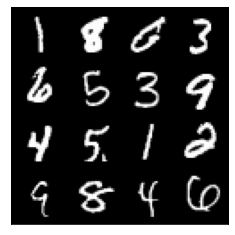

Epoch : [121 / 200] --> Discriminator Loss : 0.6059 , Generator Loss : 0.7988


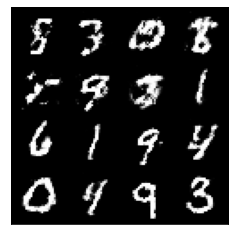

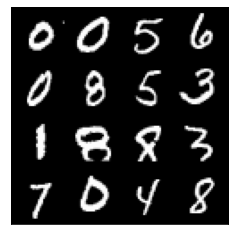

Epoch : [122 / 200] --> Discriminator Loss : 0.5358 , Generator Loss : 1.2513


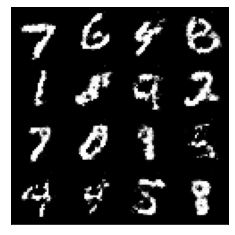

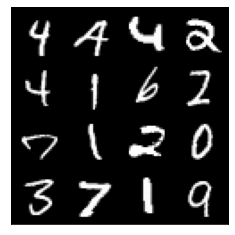

Epoch : [123 / 200] --> Discriminator Loss : 0.6511 , Generator Loss : 0.9202


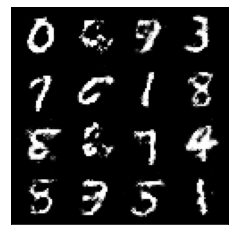

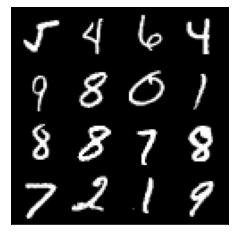

Epoch : [124 / 200] --> Discriminator Loss : 0.5018 , Generator Loss : 1.0562


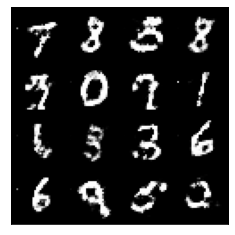

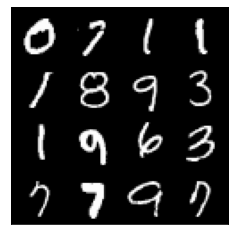

Epoch : [125 / 200] --> Discriminator Loss : 0.6912 , Generator Loss : 0.8169


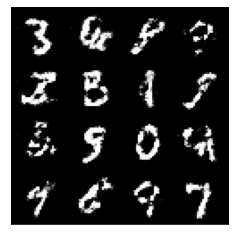

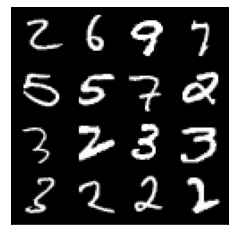

Epoch : [126 / 200] --> Discriminator Loss : 0.4518 , Generator Loss : 1.0546


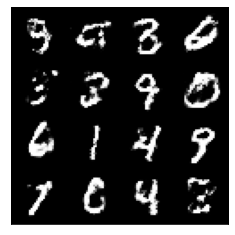

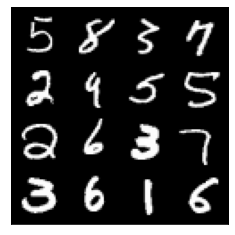

Epoch : [127 / 200] --> Discriminator Loss : 0.5855 , Generator Loss : 1.3701


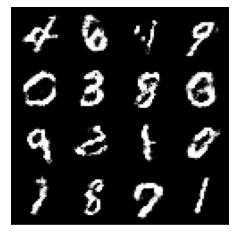

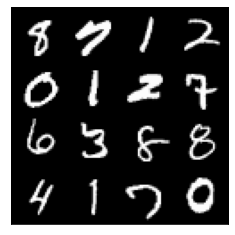

Epoch : [128 / 200] --> Discriminator Loss : 0.5408 , Generator Loss : 1.1787


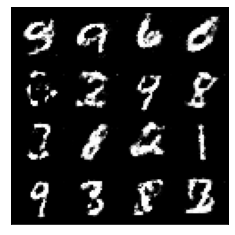

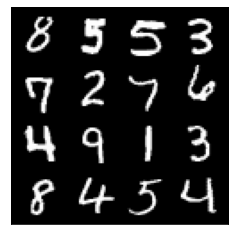

Epoch : [129 / 200] --> Discriminator Loss : 0.6270 , Generator Loss : 0.9061


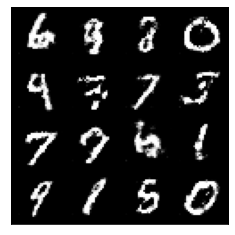

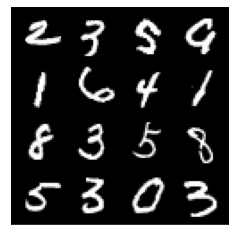

Epoch : [130 / 200] --> Discriminator Loss : 0.5900 , Generator Loss : 0.7930


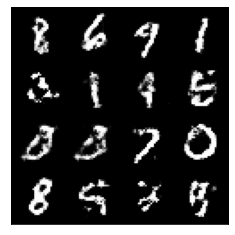

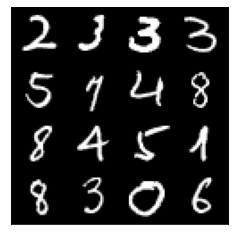

Epoch : [131 / 200] --> Discriminator Loss : 0.4582 , Generator Loss : 1.2810


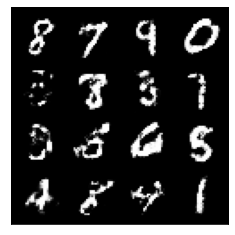

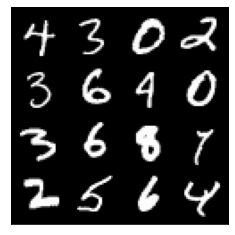

Epoch : [132 / 200] --> Discriminator Loss : 0.5820 , Generator Loss : 1.0423


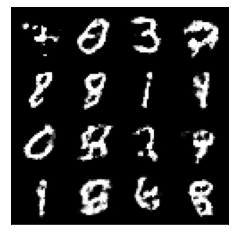

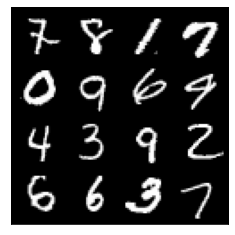

Epoch : [133 / 200] --> Discriminator Loss : 0.5731 , Generator Loss : 0.9058


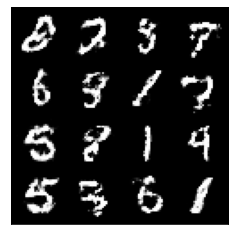

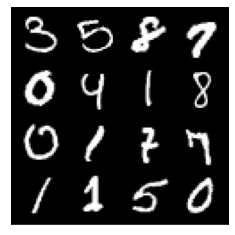

Epoch : [134 / 200] --> Discriminator Loss : 0.4529 , Generator Loss : 1.2998


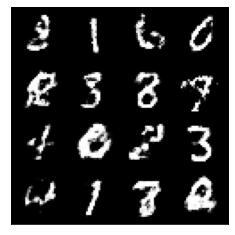

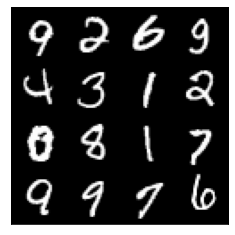

Epoch : [135 / 200] --> Discriminator Loss : 0.5493 , Generator Loss : 1.1385


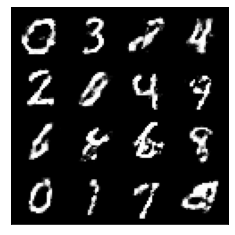

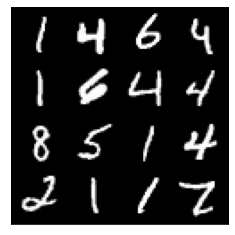

Epoch : [136 / 200] --> Discriminator Loss : 0.4776 , Generator Loss : 1.1391


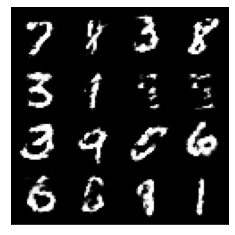

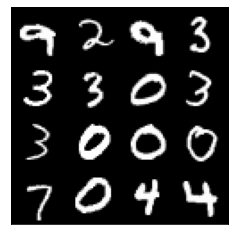

Epoch : [137 / 200] --> Discriminator Loss : 0.4906 , Generator Loss : 1.0081


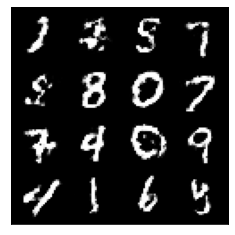

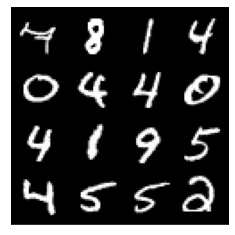

Epoch : [138 / 200] --> Discriminator Loss : 0.5955 , Generator Loss : 1.1033


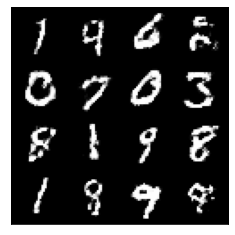

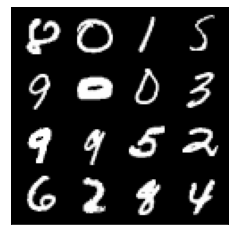

Epoch : [139 / 200] --> Discriminator Loss : 0.6258 , Generator Loss : 0.9250


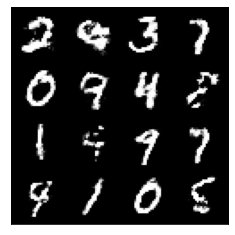

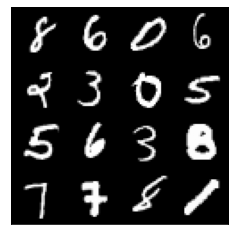

Epoch : [140 / 200] --> Discriminator Loss : 0.7288 , Generator Loss : 1.3774


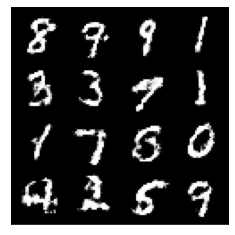

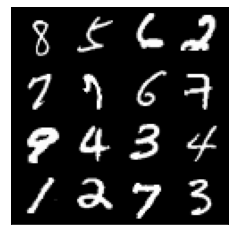

Epoch : [141 / 200] --> Discriminator Loss : 0.6828 , Generator Loss : 1.1423


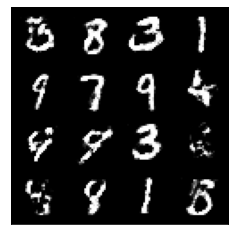

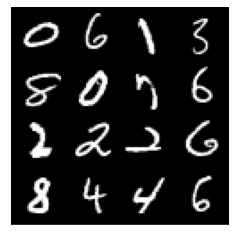

Epoch : [142 / 200] --> Discriminator Loss : 0.4718 , Generator Loss : 1.0863


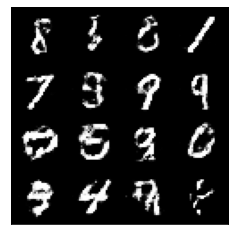

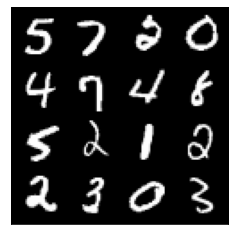

Epoch : [143 / 200] --> Discriminator Loss : 0.5826 , Generator Loss : 1.0787


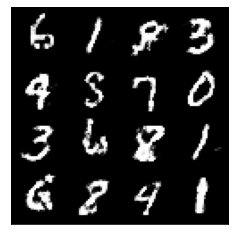

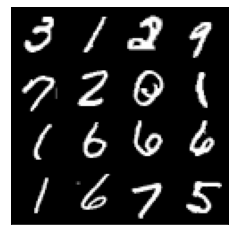

Epoch : [144 / 200] --> Discriminator Loss : 0.6147 , Generator Loss : 1.3875


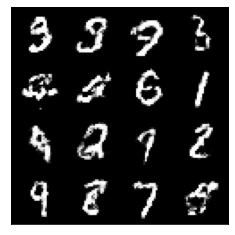

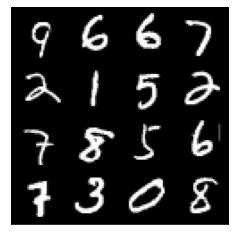

Epoch : [145 / 200] --> Discriminator Loss : 0.6211 , Generator Loss : 1.0162


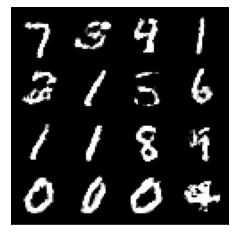

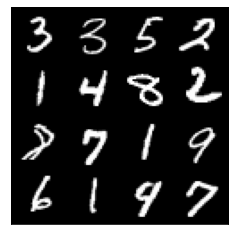

Epoch : [146 / 200] --> Discriminator Loss : 0.5930 , Generator Loss : 1.3700


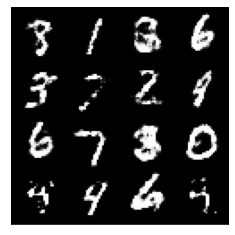

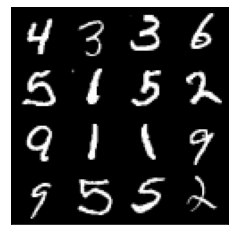

Epoch : [147 / 200] --> Discriminator Loss : 0.4663 , Generator Loss : 1.1944


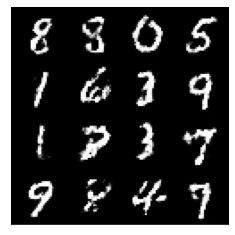

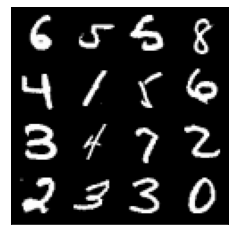

Epoch : [148 / 200] --> Discriminator Loss : 0.3857 , Generator Loss : 1.1233


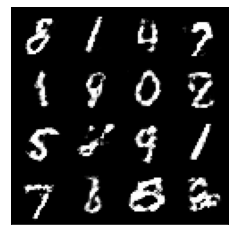

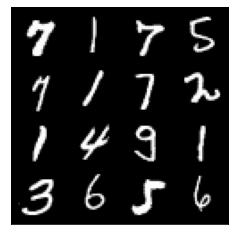

Epoch : [149 / 200] --> Discriminator Loss : 0.5951 , Generator Loss : 1.2075


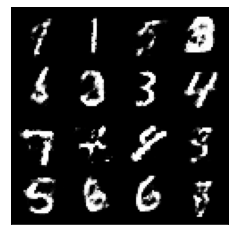

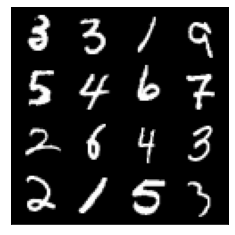

Epoch : [150 / 200] --> Discriminator Loss : 0.5463 , Generator Loss : 1.3486


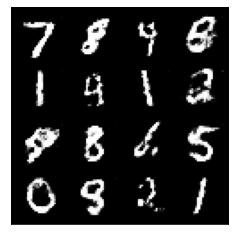

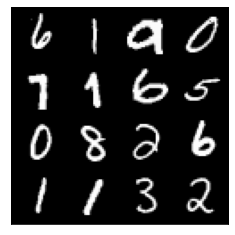

Epoch : [151 / 200] --> Discriminator Loss : 0.5239 , Generator Loss : 1.1723


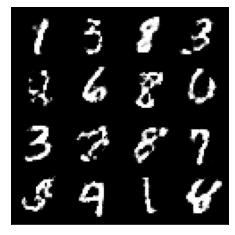

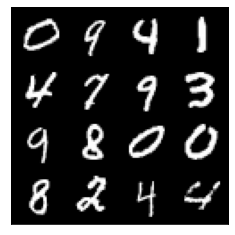

Epoch : [152 / 200] --> Discriminator Loss : 0.6110 , Generator Loss : 0.8812


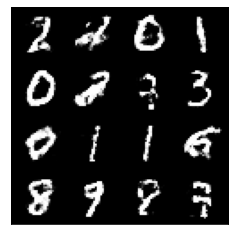

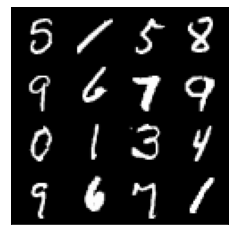

Epoch : [153 / 200] --> Discriminator Loss : 0.5446 , Generator Loss : 1.5014


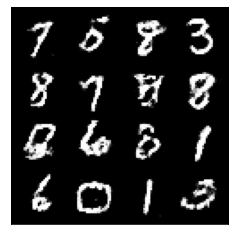

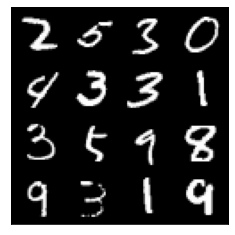

Epoch : [154 / 200] --> Discriminator Loss : 0.4924 , Generator Loss : 1.2631


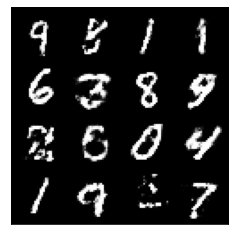

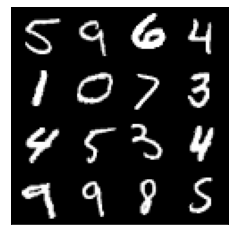

Epoch : [155 / 200] --> Discriminator Loss : 0.4551 , Generator Loss : 1.4386


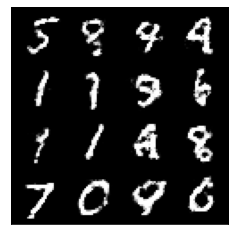

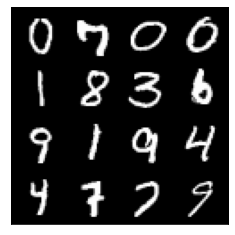

Epoch : [156 / 200] --> Discriminator Loss : 0.5596 , Generator Loss : 1.1767


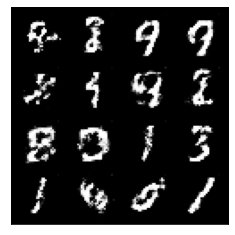

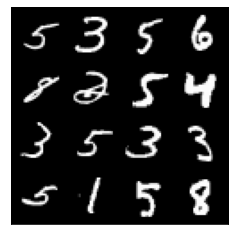

Epoch : [157 / 200] --> Discriminator Loss : 0.6517 , Generator Loss : 0.6745


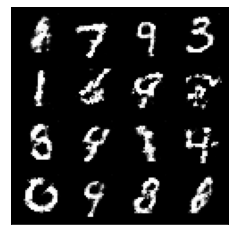

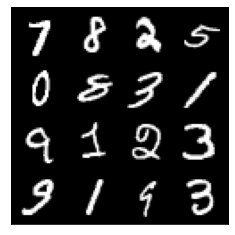

Epoch : [158 / 200] --> Discriminator Loss : 0.5362 , Generator Loss : 1.2388


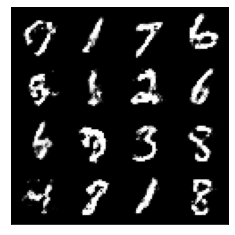

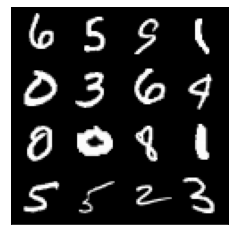

Epoch : [159 / 200] --> Discriminator Loss : 0.5897 , Generator Loss : 1.3153


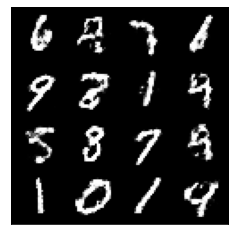

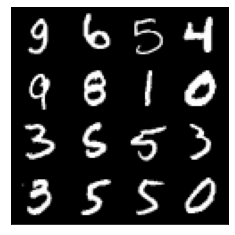

Epoch : [160 / 200] --> Discriminator Loss : 0.4702 , Generator Loss : 1.0924


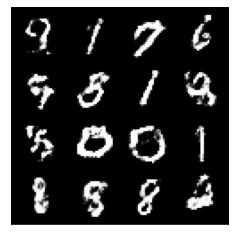

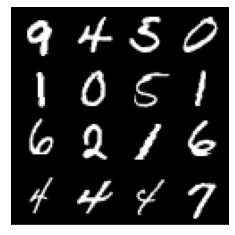

Epoch : [161 / 200] --> Discriminator Loss : 0.5638 , Generator Loss : 1.2736


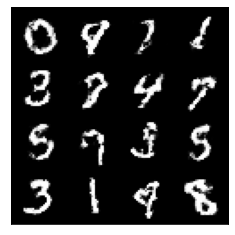

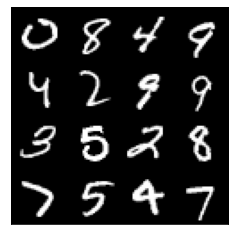

Epoch : [162 / 200] --> Discriminator Loss : 0.4316 , Generator Loss : 1.2113


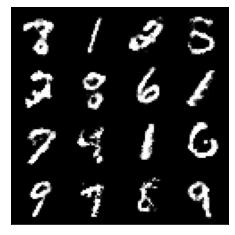

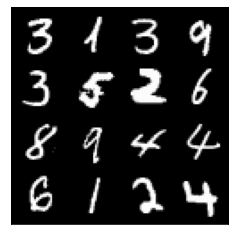

Epoch : [163 / 200] --> Discriminator Loss : 0.5660 , Generator Loss : 1.1360


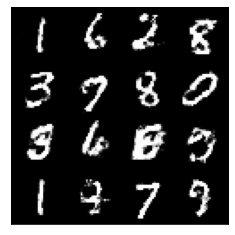

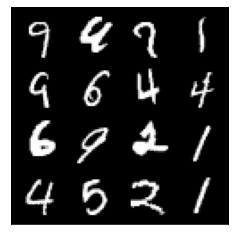

Epoch : [164 / 200] --> Discriminator Loss : 0.5433 , Generator Loss : 1.2856


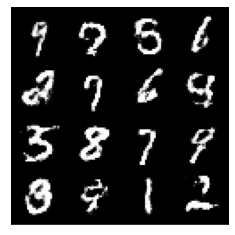

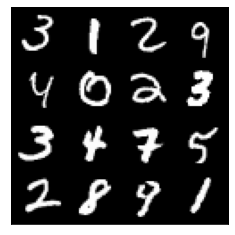

Epoch : [165 / 200] --> Discriminator Loss : 0.5562 , Generator Loss : 1.0628


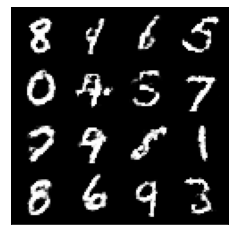

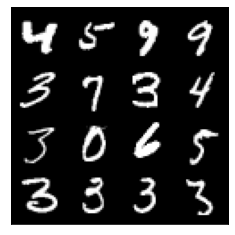

Epoch : [166 / 200] --> Discriminator Loss : 0.5352 , Generator Loss : 1.6066


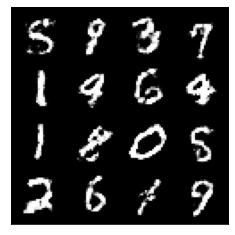

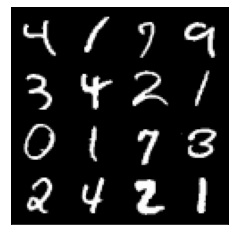

Epoch : [167 / 200] --> Discriminator Loss : 0.4589 , Generator Loss : 1.2147


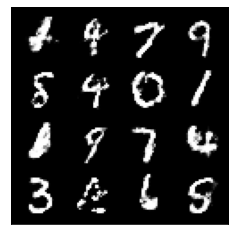

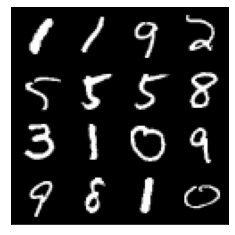

Epoch : [168 / 200] --> Discriminator Loss : 0.5511 , Generator Loss : 1.6704


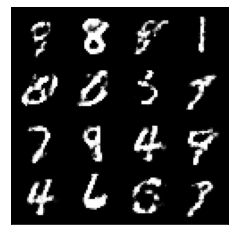

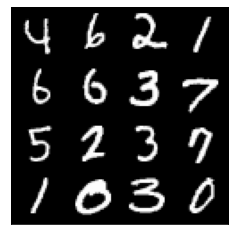

Epoch : [169 / 200] --> Discriminator Loss : 0.4100 , Generator Loss : 1.5243


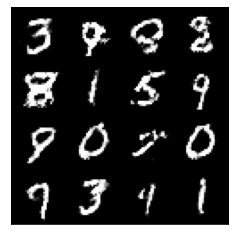

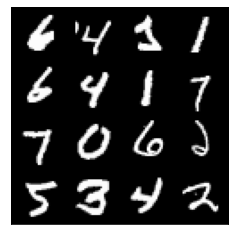

Epoch : [170 / 200] --> Discriminator Loss : 0.4937 , Generator Loss : 1.0794


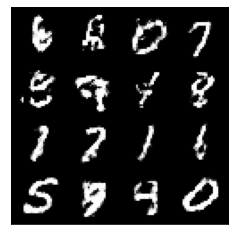

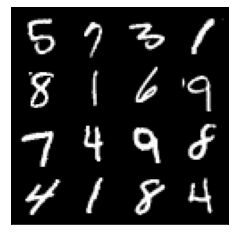

Epoch : [171 / 200] --> Discriminator Loss : 0.4543 , Generator Loss : 1.5279


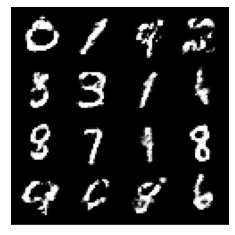

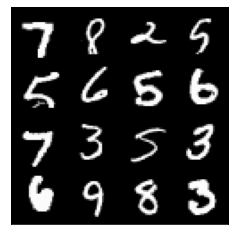

Epoch : [172 / 200] --> Discriminator Loss : 0.5014 , Generator Loss : 1.3640


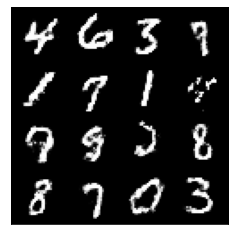

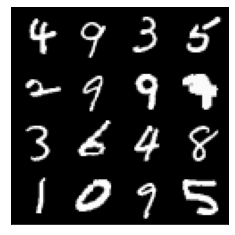

Epoch : [173 / 200] --> Discriminator Loss : 0.5343 , Generator Loss : 1.3273


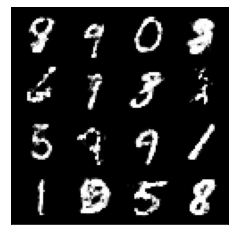

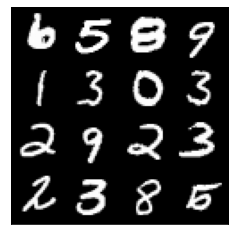

Epoch : [174 / 200] --> Discriminator Loss : 0.5756 , Generator Loss : 1.4666


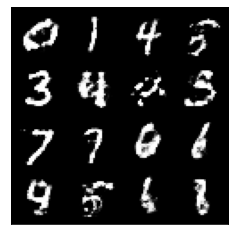

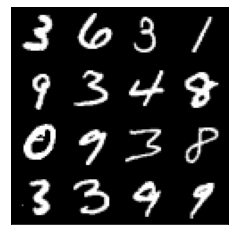

Epoch : [175 / 200] --> Discriminator Loss : 0.6575 , Generator Loss : 1.1605


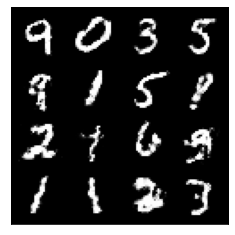

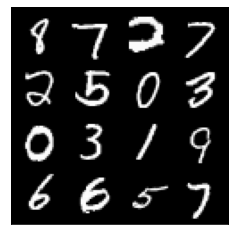

Epoch : [176 / 200] --> Discriminator Loss : 0.4737 , Generator Loss : 1.3783


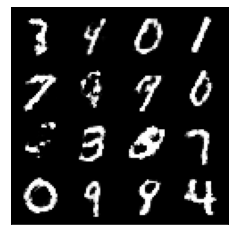

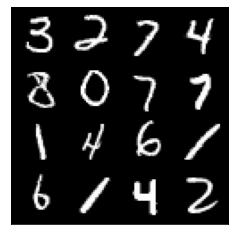

Epoch : [177 / 200] --> Discriminator Loss : 0.4057 , Generator Loss : 1.2925


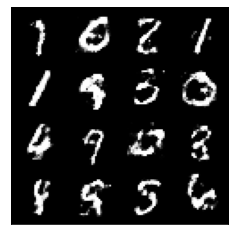

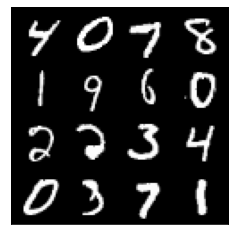

Epoch : [178 / 200] --> Discriminator Loss : 0.5489 , Generator Loss : 1.2387


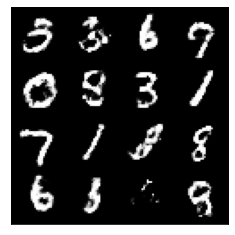

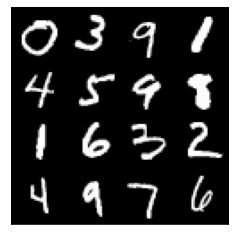

Epoch : [179 / 200] --> Discriminator Loss : 0.5241 , Generator Loss : 1.9033


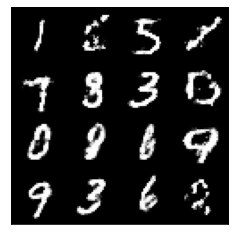

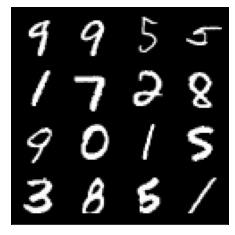

Epoch : [180 / 200] --> Discriminator Loss : 0.6591 , Generator Loss : 1.2095


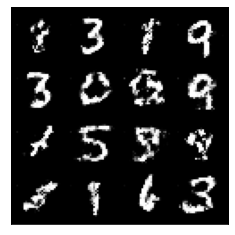

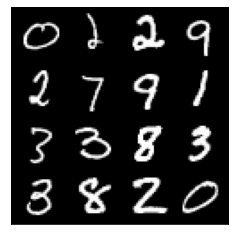

Epoch : [181 / 200] --> Discriminator Loss : 0.6381 , Generator Loss : 0.7102


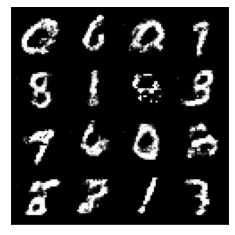

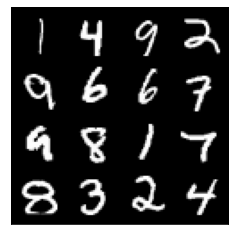

Epoch : [182 / 200] --> Discriminator Loss : 0.6056 , Generator Loss : 1.1082


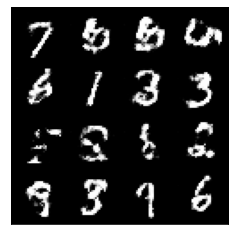

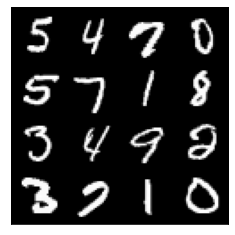

Epoch : [183 / 200] --> Discriminator Loss : 0.4727 , Generator Loss : 1.2097


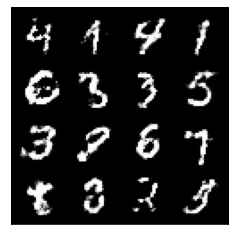

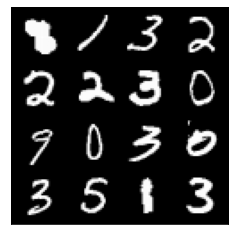

Epoch : [184 / 200] --> Discriminator Loss : 0.4335 , Generator Loss : 1.0408


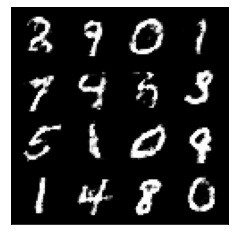

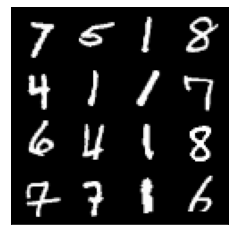

Epoch : [185 / 200] --> Discriminator Loss : 0.5932 , Generator Loss : 1.3543


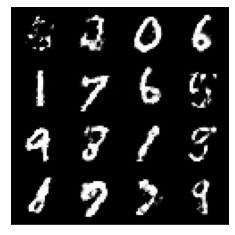

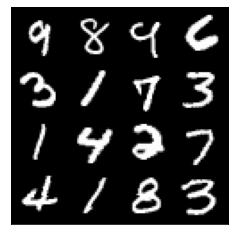

Epoch : [186 / 200] --> Discriminator Loss : 0.5074 , Generator Loss : 1.0129


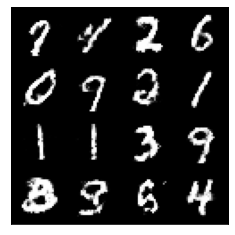

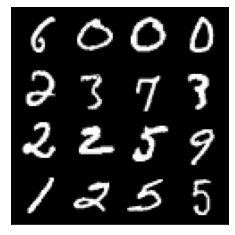

Epoch : [187 / 200] --> Discriminator Loss : 0.6047 , Generator Loss : 1.2574


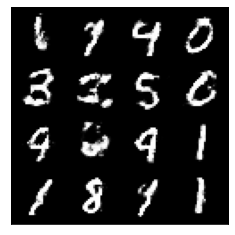

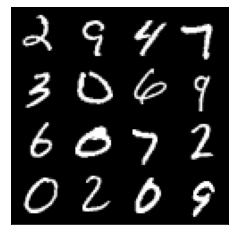

Epoch : [188 / 200] --> Discriminator Loss : 0.4801 , Generator Loss : 1.3826


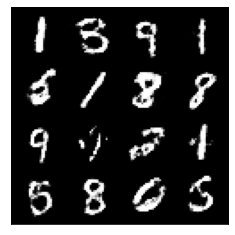

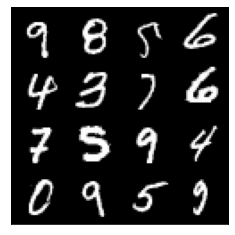

Epoch : [189 / 200] --> Discriminator Loss : 0.4770 , Generator Loss : 1.3487


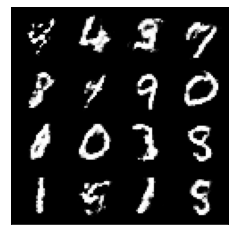

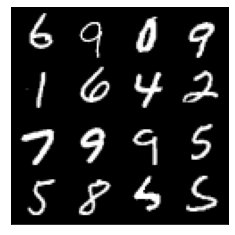

Epoch : [190 / 200] --> Discriminator Loss : 0.5445 , Generator Loss : 1.1750


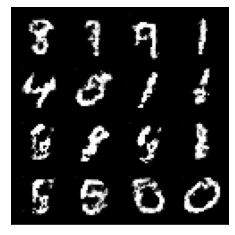

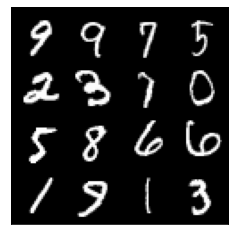

Epoch : [191 / 200] --> Discriminator Loss : 0.6230 , Generator Loss : 0.9190


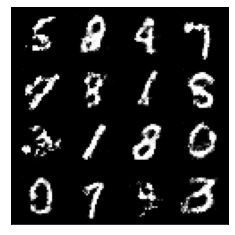

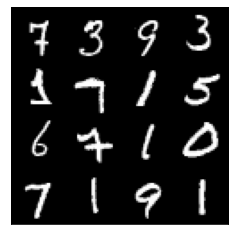

Epoch : [192 / 200] --> Discriminator Loss : 0.4705 , Generator Loss : 1.1276


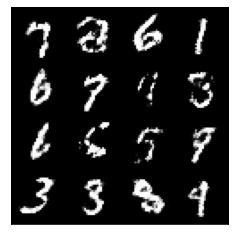

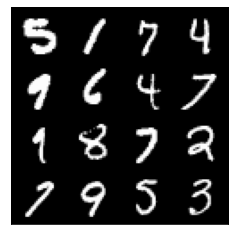

Epoch : [193 / 200] --> Discriminator Loss : 0.6980 , Generator Loss : 1.4038


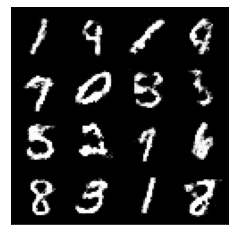

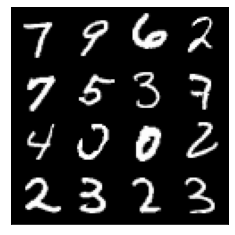

Epoch : [194 / 200] --> Discriminator Loss : 0.4023 , Generator Loss : 1.0254


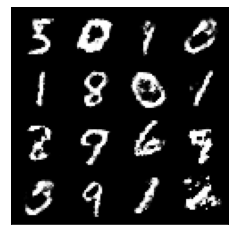

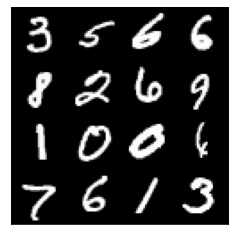

Epoch : [195 / 200] --> Discriminator Loss : 0.4794 , Generator Loss : 1.1065


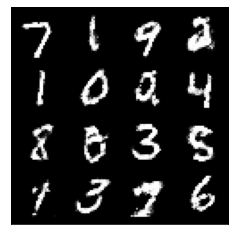

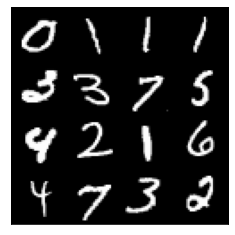

Epoch : [196 / 200] --> Discriminator Loss : 0.5094 , Generator Loss : 1.3509


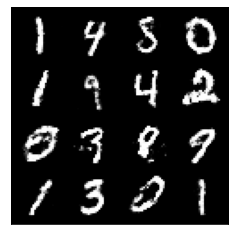

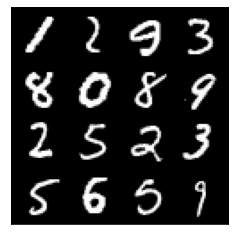

Epoch : [197 / 200] --> Discriminator Loss : 0.4716 , Generator Loss : 1.1297


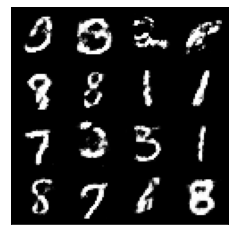

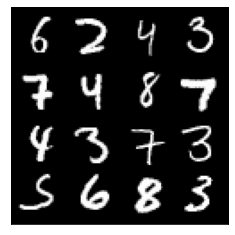

Epoch : [198 / 200] --> Discriminator Loss : 0.4460 , Generator Loss : 1.2940


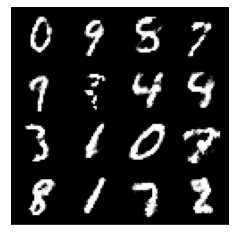

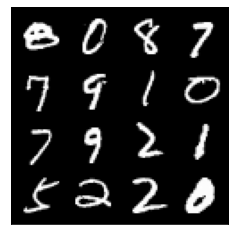

Epoch : [199 / 200] --> Discriminator Loss : 0.3993 , Generator Loss : 1.2592


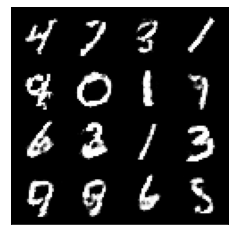

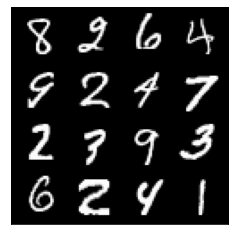

Epoch : [200 / 200] --> Discriminator Loss : 0.6361 , Generator Loss : 1.0301


In [22]:
num_epochs = 200
for epoch in range(num_epochs):
    for img , _ in mnist_dl:
        img = img.reshape(img.size(0) , -1).to(device)
        batch_size = len(img)
        disc_optim.zero_grad()
        disc_loss = disc_training(disc , gen , criterion , img , device , batch_size)
        disc_loss.backward(retain_graph = True)
        disc_optim.step()
        
        gen_optim.zero_grad()
        gen_loss = gen_training(disc , gen , criterion , device , batch_size)
        gen_loss.backward(retain_graph = True)
        gen_optim.step()
        
    some_noise = torch.randn(batch_size , 64).to(device)
    fake_img = gen(some_noise).detach()
    show_img(fake_img , batch_size)
    show_img(img , batch_size)
    
    print('Epoch : [{} / {}] --> Discriminator Loss : {:.4f} , Generator Loss : {:.4f}'.format(epoch + 1 , num_epochs , disc_loss.item() , gen_loss.item()))
    

Saving the generator and the discriminator models.

In [23]:
## Saving Generator Model ##

torch.save(gen.state_dict() , 'gen_model.pth')

## Saving Discriminator Model ##

torch.save(disc.state_dict() , 'disc_model.pth')